In [1]:
%pip install "numpy>=2.0,<2.3" --force-reinstall

  Using cached numpy-2.2.6-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (62 kB)
Using cached numpy-2.2.6-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (16.5 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.6
    Uninstalling numpy-2.2.6:
      Successfully uninstalled numpy-2.2.6
Note: you may need to restart the kernel to use updated packages.


In [1]:
# python
import sys
import os
import importlib
# columnar analysis
from coffea import processor
from coffea.nanoevents import NanoEventsFactory, NanoAODSchema
import awkward as ak
from dask.distributed import Client, performance_report
# local
sidm_path = str(os.getcwd()).split("/sidm")[0]
# sidm_path = str(sys.path[0]).split("/sidm")[0]
if sidm_path not in sys.path: sys.path.insert(1, sidm_path)
from sidm.tools import utilities, sidm_processor, scaleout, cutflow
from sidm.tools import llpnanoaodschema
# always reload local modules to pick up changes during development
importlib.reload(utilities)
importlib.reload(sidm_processor)
importlib.reload(scaleout)
# plotting
import matplotlib.pyplot as plt
utilities.set_plot_style()
%matplotlib inline
from tqdm.notebook import tqdm
import coffea.util
import numpy as np
import mplhep as hep
import yaml
from collections import defaultdict
import math
import pandas as pd
from IPython.display import display, Markdown

In [2]:
samples_bkg = [
    "TTJets",
    "QCD_Pt15To20",
    "QCD_Pt20To30",
    "QCD_Pt30To50",
    "QCD_Pt50To80",
    "QCD_Pt80To120", 
    "QCD_Pt120To170",
    "QCD_Pt170To300", 
    "QCD_Pt300To470",
    "QCD_Pt470To600", 
    "QCD_Pt600To800", 
    "QCD_Pt800To1000",
    "QCD_Pt1000", 
    "DYJetsToMuMu_M10to50",
    "DYJetsToMuMu_M50", 
    "WW",
    "WZ",
    "ZZ",
]

In [3]:
#First check if there is already an out dictionary
try:
    out
    print("The _out_ dictionary already exists; will use what is saved in memory if possible")
except NameError:
    print("WARNING! No processor output stored in the kernel's memory. Will try to load pickled coffea file for each sample instead")
    out = {}

#For each sample, try to use the data in memory if possible; if not try to load the file
#If those both fail, then raise an error and skip it
for sample in samples_bkg:
    if sample in out:
        print(f"{sample} already found in memory; not loading file")
    else:
        print(f"Loading file for sample {sample}")
        filename = sample + ".coffea"
        try: 
            output = coffea.util.load("Mother_Tracking_LJ_Kinematics_BKG/"+filename)
            print("Successfully opened file")        
            out[sample] = output["out"][sample]
            # out[sample] = output["out"][sample.removesuffix("_part1")]
        except Exception:
            out[sample] = output[sample]
            # print("**** ERROR! File not found. Check the file name, or run the processor again and save the output to a pickle file using coffea.util.save")

WARNING! No processor output stored in the kernel's memory. Will try to load pickled coffea file for each sample instead
Loading file for sample TTJets
Successfully opened file
Loading file for sample QCD_Pt15To20
Successfully opened file
Loading file for sample QCD_Pt20To30
Successfully opened file
Loading file for sample QCD_Pt30To50
Successfully opened file
Loading file for sample QCD_Pt50To80
Successfully opened file
Loading file for sample QCD_Pt80To120
Successfully opened file
Loading file for sample QCD_Pt120To170
Successfully opened file
Loading file for sample QCD_Pt170To300
Successfully opened file
Loading file for sample QCD_Pt300To470
Successfully opened file
Loading file for sample QCD_Pt470To600
Successfully opened file
Loading file for sample QCD_Pt600To800
Successfully opened file
Loading file for sample QCD_Pt800To1000
Successfully opened file
Loading file for sample QCD_Pt1000
Successfully opened file
Loading file for sample DYJetsToMuMu_M10to50
Successfully opened fi

In [4]:
channels = [
    "data_control_region_1muLj_cosmic_veto",
    "data_control_region_1egmLj_cosmic_veto",
    "data_control_region_1muLj_1egmLj_cosmic_veto",
    "data_control_region_2muLj_cosmic_veto",
]

In [5]:
BACKGROUND_CATEGORY_ORDER = [
    "Z", "W", "e", r"$\pi$", r"$\eta$/$\omega$",
    "B Meson", "D Meson", "Quark/Gluon", r"J/$\Psi$", "Others",
]

OBJECT_HISTOGRAMS = {
    "Electron": "fs_e_gen_mother_id",
    "Muon": "fs_mu_gen_mother_id",
    "Photon": "fs_pho_gen_mother_id",
}

def categorize_background_mother(pdgid):
    abs_id = abs(pdgid)
    if abs_id == 23:
        return "Z"
    if abs_id == 24:
        return "W"
    if abs_id == 11:
        return "e"
    if abs_id in (111, 211):
        return r"$\pi$"
    if abs_id in (221, 223):
        return r"$\eta$/$\omega$"
    if abs_id in (511, 521, 531, 541):
        return "B Meson"
    if abs_id in (411, 421, 423, 431):
        return "D Meson"
    if abs_id in (1, 2, 3, 4, 5, 6, 9, 21):
        return "Quark/Gluon"
    if abs_id == 443:
        return r"J/$\Psi$"
    return "Others"

def get_sample_output(output, sample):
    if isinstance(output, dict) and "out" in output:
        return output["out"][sample]
    return output[sample]

def get_channel_histogram(sample_output, histogram_name, channel):
    return sample_output["hists"][histogram_name][channel, :]

def histogram_values_and_variances(histogram):
    values = np.asarray(histogram.values(flow=False), dtype=float)

    try:
        variances = histogram.variances(flow=False)
    except TypeError:
        variances = histogram.variances()
    except Exception:
        variances = None

    if variances is None:
        variances = np.abs(values)
    else:
        variances = np.asarray(variances, dtype=float)
        variances = np.where(np.isfinite(variances) & (variances >= 0), variances, 0.0)

    return values, variances

def sum_hist_values_and_variances(output, sample_names, channel, histogram_name):
    values = None
    variances = None

    for sample in sample_names:
        try:
            sample_output = get_sample_output(output, sample)
        except KeyError:
            print(f"[WARNING] sample not found: {sample}. Skipping.")
            continue

        if histogram_name not in sample_output["hists"]:
            print(f"[WARNING] histogram not found for {sample}: {histogram_name}. Skipping.")
            continue

        sample_hist = get_channel_histogram(sample_output, histogram_name, channel)
        sample_values, sample_variances = histogram_values_and_variances(sample_hist)

        values = sample_values.copy() if values is None else values + sample_values
        variances = sample_variances.copy() if variances is None else variances + sample_variances

    if values is None:
        raise RuntimeError(
            f"No valid histogram values found for histogram={histogram_name}, channel={channel}"
        )

    return values, variances

def sum_hist_values(output, sample_names, channel, histogram_name):
    values, _ = sum_hist_values_and_variances(
        output,
        sample_names,
        channel,
        histogram_name,
    )
    return values

def categorize_hist_values(values, categorizer):
    category_counts = defaultdict(float)
    other_counts = defaultdict(float)

    for pdgid, count in enumerate(values):
        if count == 0:
            continue

        category = categorizer(pdgid)
        category_counts[category] += float(count)

        if category == "Others":
            other_counts[pdgid] += float(count)

    return category_counts, other_counts

def categorize_hist_values_and_variances(values, variances, categorizer):
    category_counts = defaultdict(float)
    category_variances = defaultdict(float)
    other_counts = defaultdict(float)

    for pdgid, (count, variance) in enumerate(zip(values, variances)):
        if count == 0 and variance == 0:
            continue

        category = categorizer(pdgid)
        category_counts[category] += float(count)
        category_variances[category] += float(variance)

        if category == "Others":
            other_counts[pdgid] += float(count)

    return category_counts, category_variances, other_counts

def make_category_tables(output, sample_groups, channel, histogram_name, categorizer, category_order):
    yields = {}
    other_details = {}

    for group, sample_names in sample_groups.items():
        values = sum_hist_values(output, sample_names, channel, histogram_name)
        yields[group], other_details[group] = categorize_hist_values(values, categorizer)

    yield_table = pd.DataFrame(yields).T.fillna(0)
    yield_table = yield_table.reindex(columns=category_order, fill_value=0)

    totals = yield_table.sum(axis=1).replace(0, np.nan)
    fraction_table = yield_table.div(totals, axis=0).fillna(0)

    other_table = pd.DataFrame(other_details).T.fillna(0)
    if not other_table.empty:
        other_table = other_table.loc[:, (other_table != 0).any(axis=0)]
        other_table = other_table.reindex(sorted(other_table.columns), axis=1)

    return yield_table, fraction_table, other_table

def make_category_error_table(output, sample_groups, channel, histogram_name, categorizer, category_order):
    variances = {}

    for group, sample_names in sample_groups.items():
        values, summed_variances = sum_hist_values_and_variances(
            output,
            sample_names,
            channel,
            histogram_name,
        )
        _, category_variances, _ = categorize_hist_values_and_variances(
            values,
            summed_variances,
            categorizer,
        )
        variances[group] = category_variances

    variance_table = pd.DataFrame(variances).T.fillna(0)
    variance_table = variance_table.reindex(columns=category_order, fill_value=0)
    return np.sqrt(variance_table)

def make_object_category_table(output, sample_names, channel, categorizer, category_order):
    object_counts = {}

    for object_name, histogram_name in OBJECT_HISTOGRAMS.items():
        values = sum_hist_values(output, sample_names, channel, histogram_name)
        object_counts[object_name], _ = categorize_hist_values(values, categorizer)

    return pd.DataFrame(object_counts).fillna(0).reindex(category_order, fill_value=0)

def plot_category_table(table, title, ylabel, logy=False):
    ax = table.T.plot(
        kind="bar",
        figsize=(24, 12),
        width=0.8,
        logy=logy,
    )

    ax.set_title(title)
    ax.set_xlabel("Mother category")
    ax.set_ylabel(ylabel)
    ax.tick_params(axis="x", rotation=45)
    ax.legend(title="Process")

    plt.tight_layout()
    plt.show()
    plt.close()

In [6]:
background_groups = {
    "QCD": [
        "QCD_Pt15To20",
        "QCD_Pt20To30",
        "QCD_Pt30To50",
        "QCD_Pt50To80",
        "QCD_Pt80To120",
        "QCD_Pt120To170",
        "QCD_Pt170To300",
        "QCD_Pt300To470",
        "QCD_Pt470To600",
        "QCD_Pt600To800",
        "QCD_Pt800To1000",
        "QCD_Pt1000",
    ],
    "DY": [
        "DYJetsToMuMu_M10to50",
        "DYJetsToMuMu_M50",
    ],
    "TT": [
        "TTJets",
    ],
    "Diboson": [
        "WW",
        "WZ",
        "ZZ",
    ],
}

In [7]:
qcd_process_groups = {
    "QCD_Pt15To20": ["QCD_Pt15To20"],
    "QCD_Pt20To30": ["QCD_Pt20To30"],
    "QCD_Pt30To50": ["QCD_Pt30To50"],
    "QCD_Pt50To80": ["QCD_Pt50To80"],
    "QCD_Pt80To120": ["QCD_Pt80To120"],
    "QCD_Pt120To170": ["QCD_Pt120To170"],
    "QCD_Pt170To300": ["QCD_Pt170To300"],
    "QCD_Pt300To470": ["QCD_Pt300To470"],
    "QCD_Pt470To600": ["QCD_Pt470To600"],
    "QCD_Pt600To800": ["QCD_Pt600To800"],
    "QCD_Pt800To1000": ["QCD_Pt800To1000"],
    "QCD_Pt1000": ["QCD_Pt1000"],
}

nonqcd_process_groups = {
    "DYJetsToMuMu_M10to50": ["DYJetsToMuMu_M10to50"],
    "DYJetsToMuMu_M50": ["DYJetsToMuMu_M50"],
    "TTJets": ["TTJets"],
    "WW": ["WW"],
    "WZ": ["WZ"],
    "ZZ": ["ZZ"],
}

In [8]:
PROCESS_COLORS = {
    # grouped level
    "QCD": "#832db6",
    "DY": "#b9ac70",
    "TT": "#3f90da",
    "Diboson": "#717581",

    # QCD sub-processes
    "QCD_Pt15To20": "#004488",
    "QCD_Pt20To30": "#3f90da",
    "QCD_Pt30To50": "#ffa90e",
    "QCD_Pt50To80": "#bd1f01",
    "QCD_Pt80To120": "#94a4a2",
    "QCD_Pt120To170": "#009E73",
    "QCD_Pt170To300": "#832db6",
    "QCD_Pt300To470": "#a96b59",
    "QCD_Pt470To600": "#e76300",
    "QCD_Pt600To800": "#b9ac70",
    "QCD_Pt800To1000": "#CC79A7",
    "QCD_Pt1000": "#92dadd",

    # non-QCD sub-processes
    "DYJetsToMuMu_M10to50": "#5790fc",
    "DYJetsToMuMu_M50": "#f89c20",
    "TTJets": "#e42536",
    "WW": "#964a8b",
    "WZ": "#9c9ca1",
    "ZZ": "#7a21dd",
}

def add_bar_errorbars(ax, table, error_table, color="black", capsize=2, elinewidth=1.1):
    if error_table is None:
        return

    aligned_errors = error_table.reindex(index=table.index, columns=table.columns).fillna(0.0)

    for process, container in zip(table.index, ax.containers):
        if process not in aligned_errors.index:
            continue
        errors = aligned_errors.loc[process, table.columns].to_numpy(dtype=float)
        centers = np.array([patch.get_x() + patch.get_width() / 2 for patch in container.patches])
        heights = np.array([patch.get_height() for patch in container.patches], dtype=float)
        visible = np.isfinite(heights) & np.isfinite(errors) & (heights > 0)
        if np.any(visible):
            ax.errorbar(
                centers[visible],
                heights[visible],
                yerr=errors[visible],
                fmt="none",
                ecolor=color,
                elinewidth=elinewidth,
                capsize=capsize,
                zorder=5,
            )

def plot_category_table(
    table,
    title,
    ylabel,
    logy=False,
    ylim=None,
    figsize=(24, 12),
    error_table=None,
):
    colors = [
        PROCESS_COLORS.get(process, None)
        for process in table.index
    ]

    ax = table.T.plot(
        kind="bar",
        figsize=figsize,
        width=0.8,
        logy=logy,
        color=colors,
        edgecolor="black",
    )

    add_bar_errorbars(ax, table, error_table)

    ax.set_title(title)
    ax.set_xlabel("Mother category")
    ax.set_ylabel(ylabel)
    ax.tick_params(axis="x", rotation=45)
    ax.legend(
        title="Process",
        bbox_to_anchor=(1.05, 1),
        loc="upper left",
    )

    if ylim is not None:
        ax.set_ylim(*ylim)

    plt.tight_layout()
    plt.show()
    plt.close()

In [11]:
def make_and_show_background_set(
    output,
    sample_groups,
    channel,
    set_label,
    table_store,
    histogram_name="fs_gen_mother_id",
    figsize=(24, 12),
):
    yield_table, fraction_table, other_table = make_category_tables(
        output,
        sample_groups,
        channel,
        histogram_name,
        categorize_background_mother,
        BACKGROUND_CATEGORY_ORDER,
    )
    error_table = make_category_error_table(
        output,
        sample_groups,
        channel,
        histogram_name,
        categorize_background_mother,
        BACKGROUND_CATEGORY_ORDER,
    )

    table_store[channel] = {
        "yield": yield_table,
        "error": error_table,
        "fraction": fraction_table,
        "other": other_table,
    }

    print()
    print("-" * 120)
    print(f"{channel}: {set_label}")
    print("-" * 120)

    plot_inputs = [("Inclusive", yield_table, error_table)]

    if histogram_name == "fs_gen_mother_id":
        table_store[channel]["objects"] = {}
        for object_name, object_histogram_name in OBJECT_HISTOGRAMS.items():
            object_yield_table, object_fraction_table, object_other_table = make_category_tables(
                output,
                sample_groups,
                channel,
                object_histogram_name,
                categorize_background_mother,
                BACKGROUND_CATEGORY_ORDER,
            )
            object_error_table = make_category_error_table(
                output,
                sample_groups,
                channel,
                object_histogram_name,
                categorize_background_mother,
                BACKGROUND_CATEGORY_ORDER,
            )
            table_store[channel]["objects"][object_name] = {
                "yield": object_yield_table,
                "error": object_error_table,
                "fraction": object_fraction_table,
                "other": object_other_table,
            }
            plot_inputs.append((object_name, object_yield_table, object_error_table))

    for object_label, plot_yield_table, plot_error_table in plot_inputs:
        title_label = set_label if object_label == "Inclusive" else f"{set_label} ({object_label})"

        plot_category_table(
            plot_yield_table,
            None,
            "Weighted object yield",
            logy=True,
            figsize=figsize,
            error_table=plot_error_table,
        )

    return yield_table, fraction_table, other_table


Channel: data_control_region_1muLj_cosmic_veto

------------------------------------------------------------------------------------------------------------------------
data_control_region_1muLj_cosmic_veto: None
------------------------------------------------------------------------------------------------------------------------


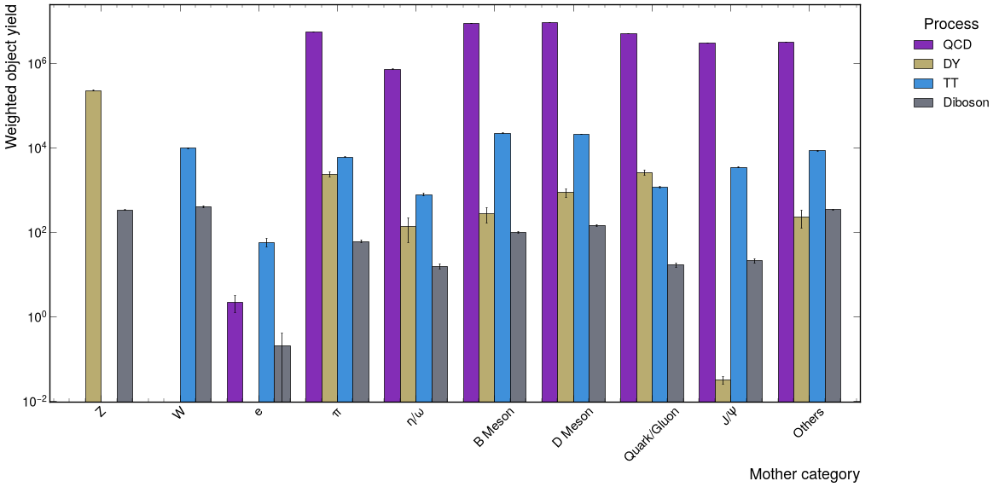

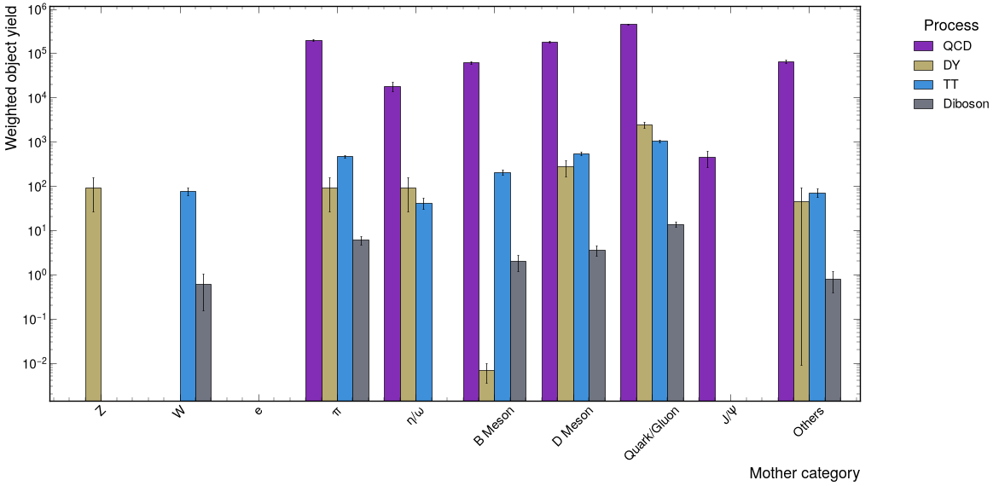

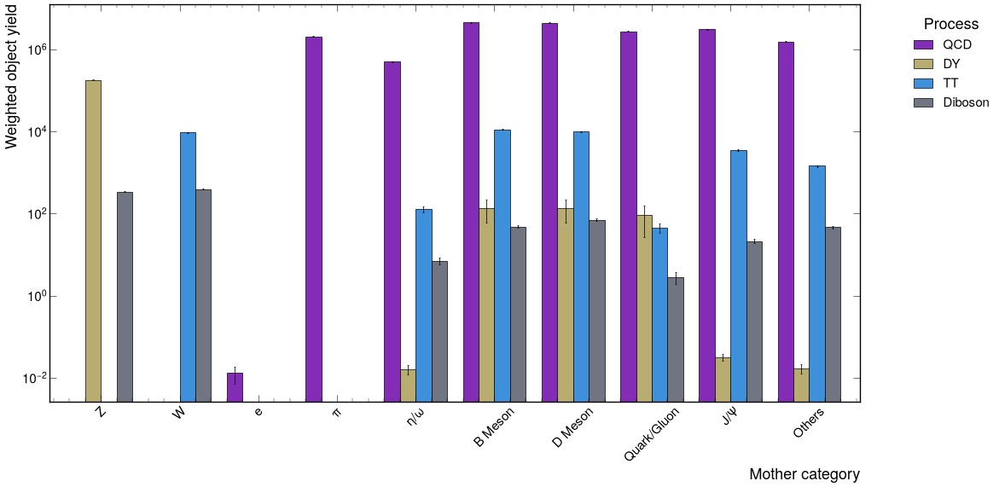

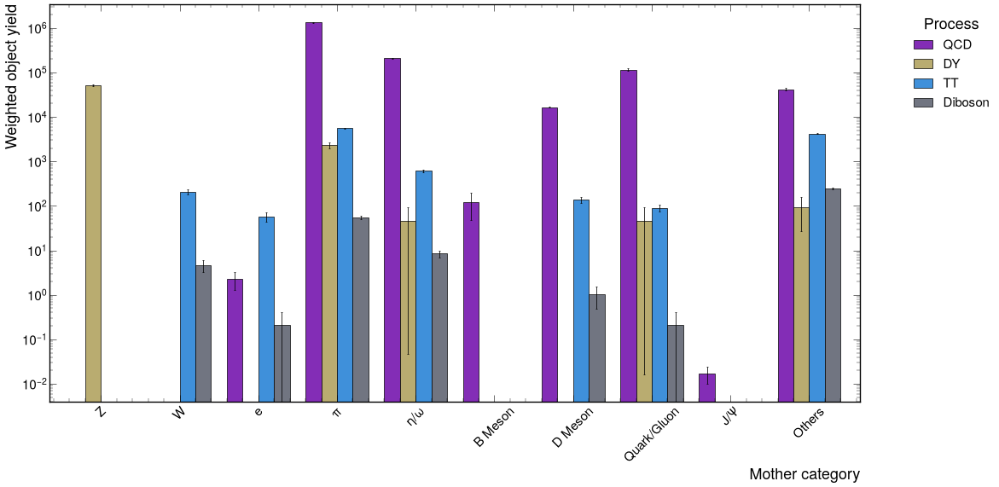


Channel: data_control_region_1egmLj_cosmic_veto

------------------------------------------------------------------------------------------------------------------------
data_control_region_1egmLj_cosmic_veto: None
------------------------------------------------------------------------------------------------------------------------


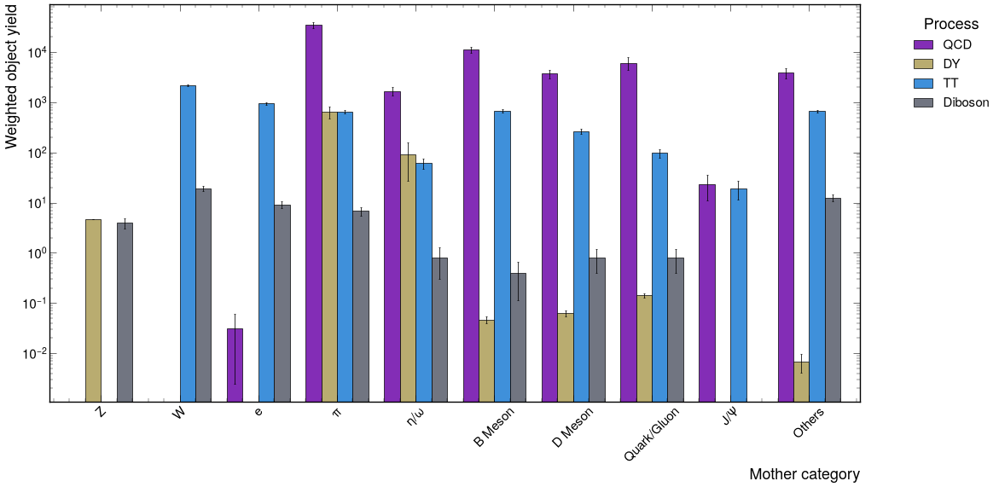

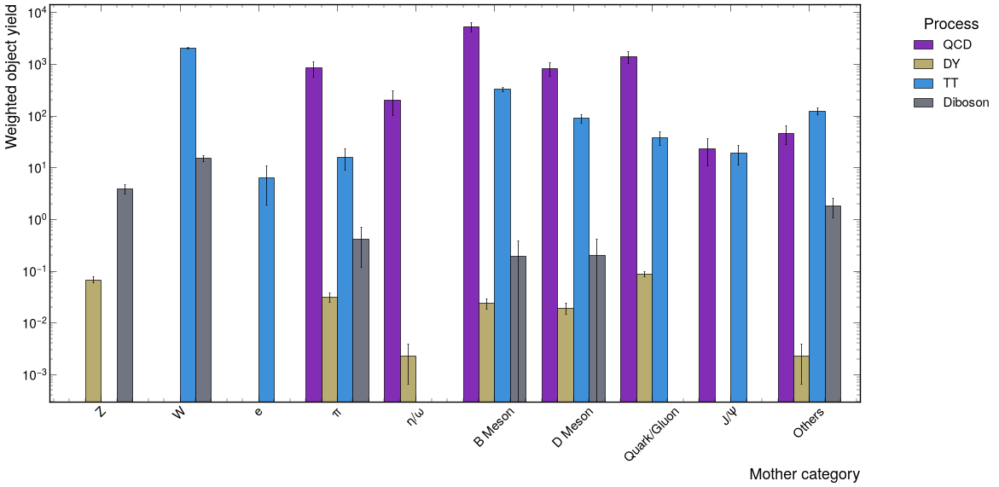

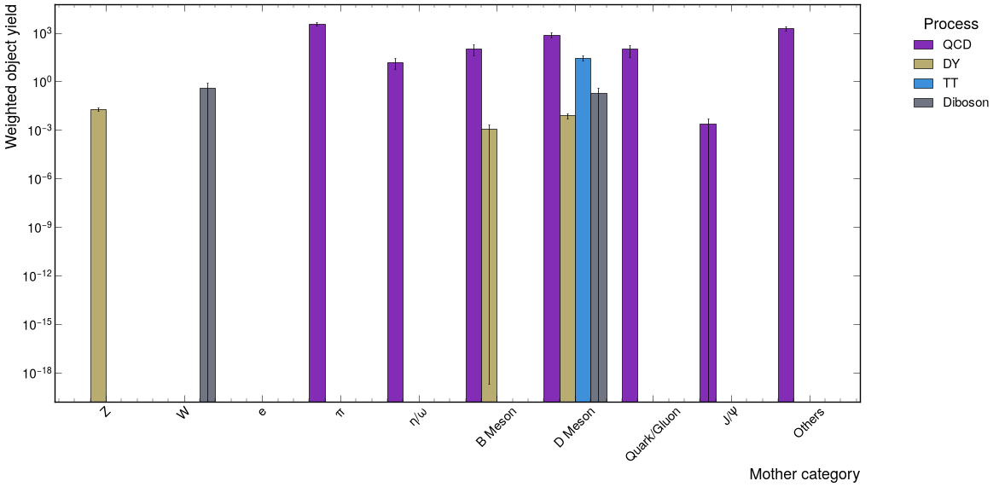

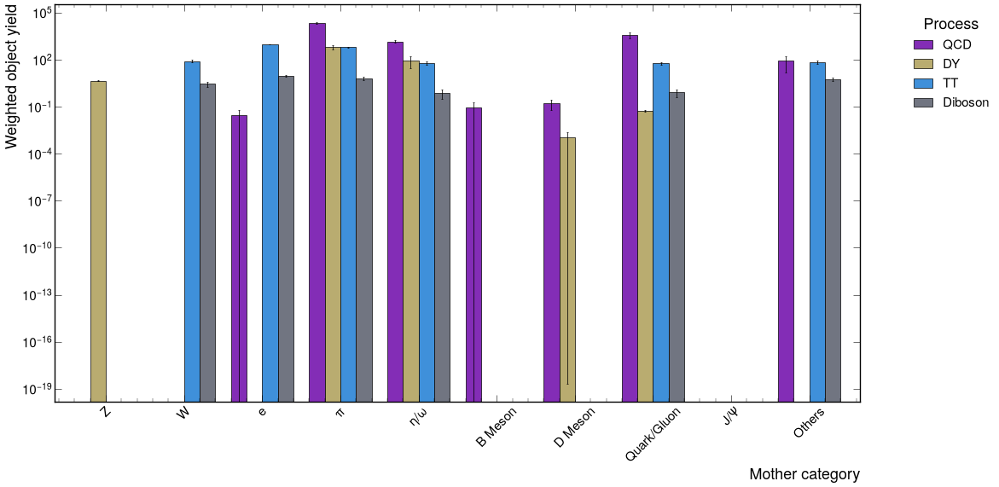


Channel: data_control_region_1muLj_1egmLj_cosmic_veto

------------------------------------------------------------------------------------------------------------------------
data_control_region_1muLj_1egmLj_cosmic_veto: None
------------------------------------------------------------------------------------------------------------------------


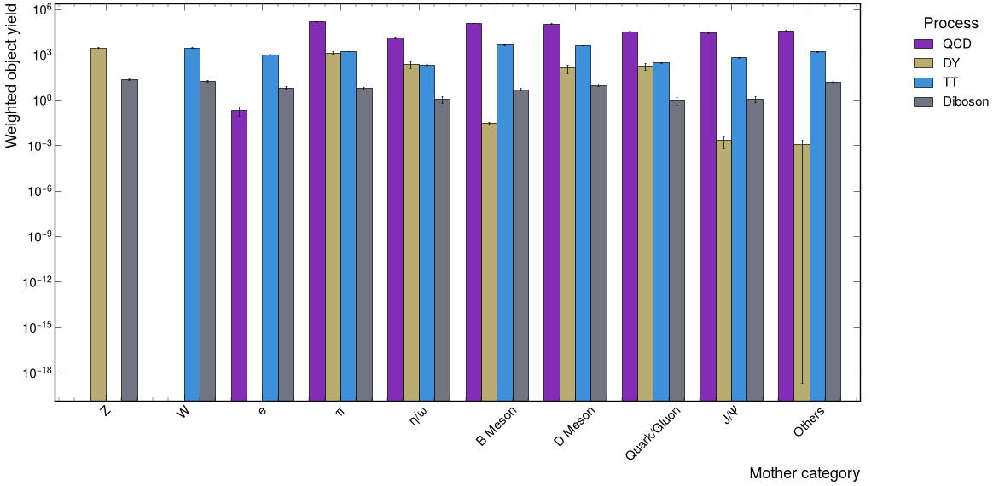

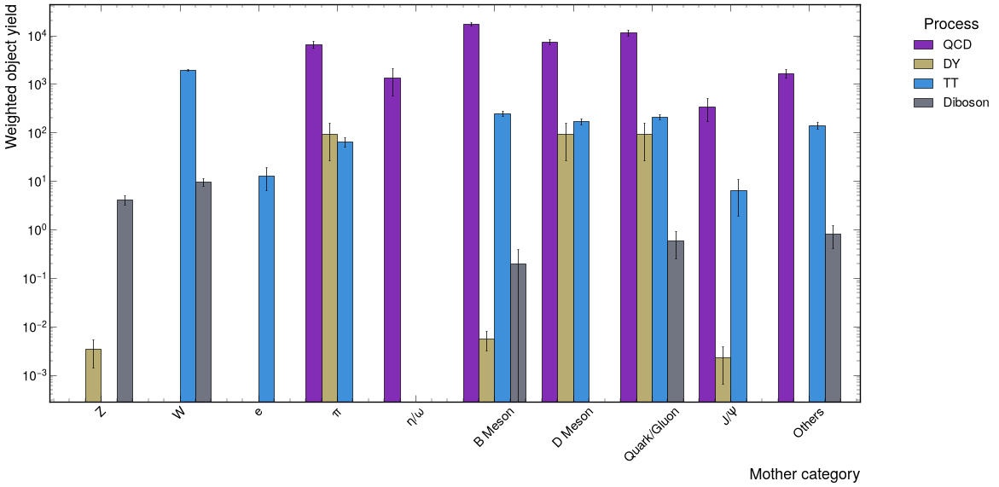

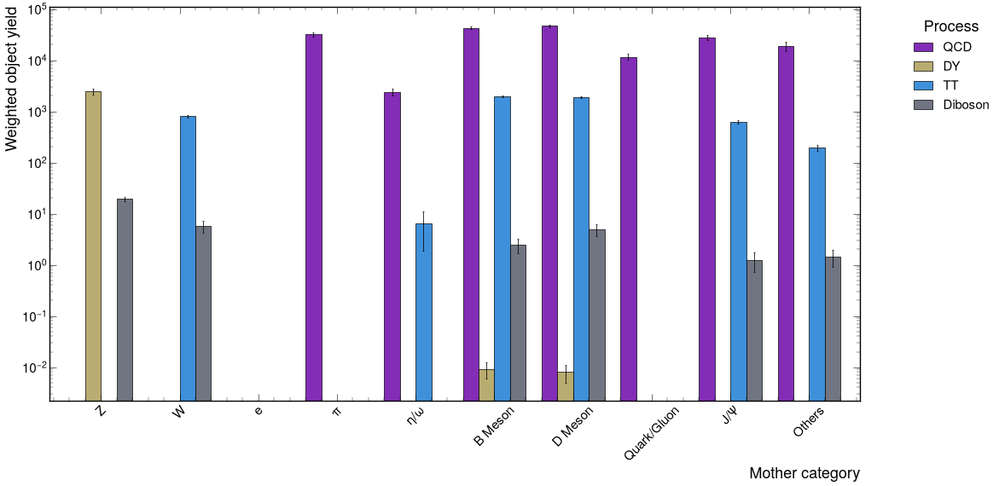

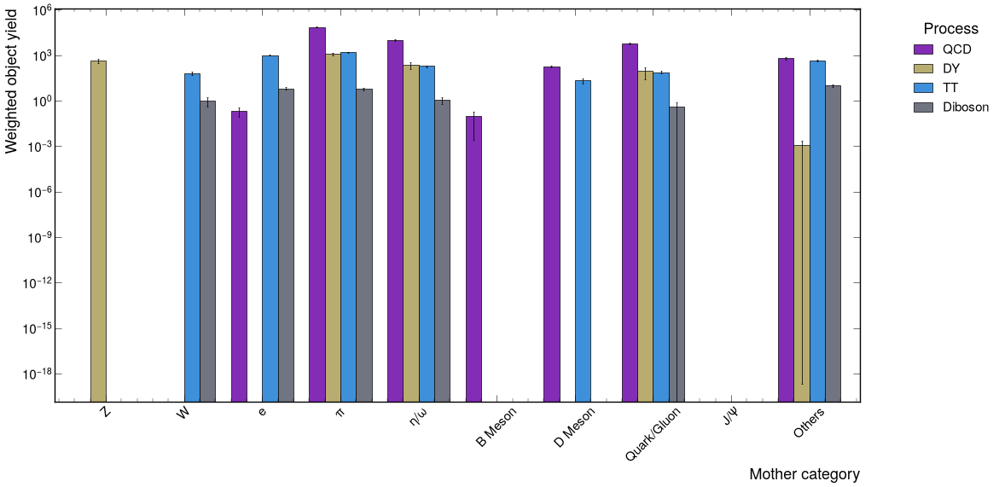


Channel: data_control_region_2muLj_cosmic_veto

------------------------------------------------------------------------------------------------------------------------
data_control_region_2muLj_cosmic_veto: None
------------------------------------------------------------------------------------------------------------------------


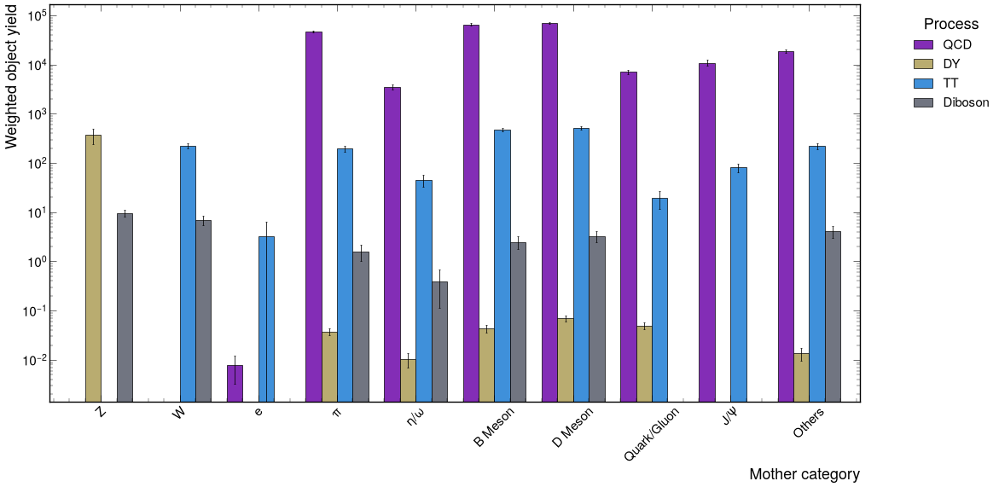

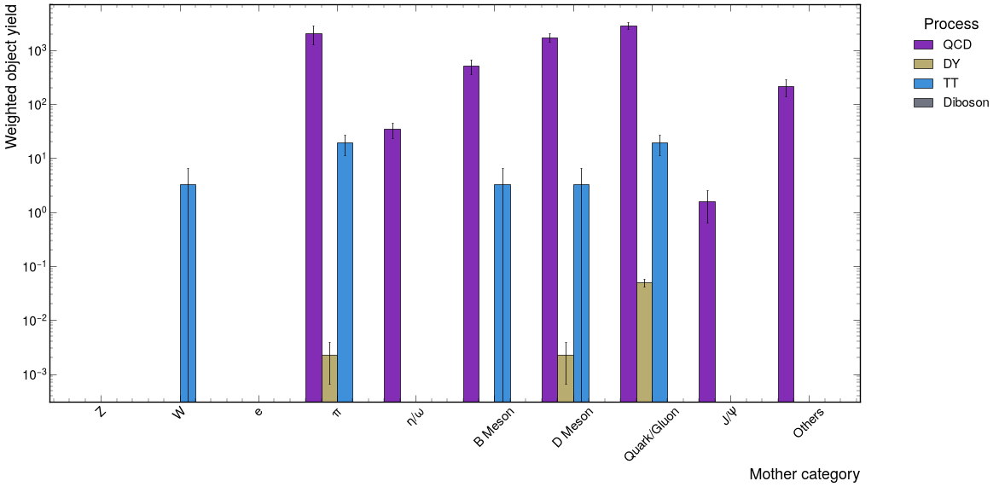

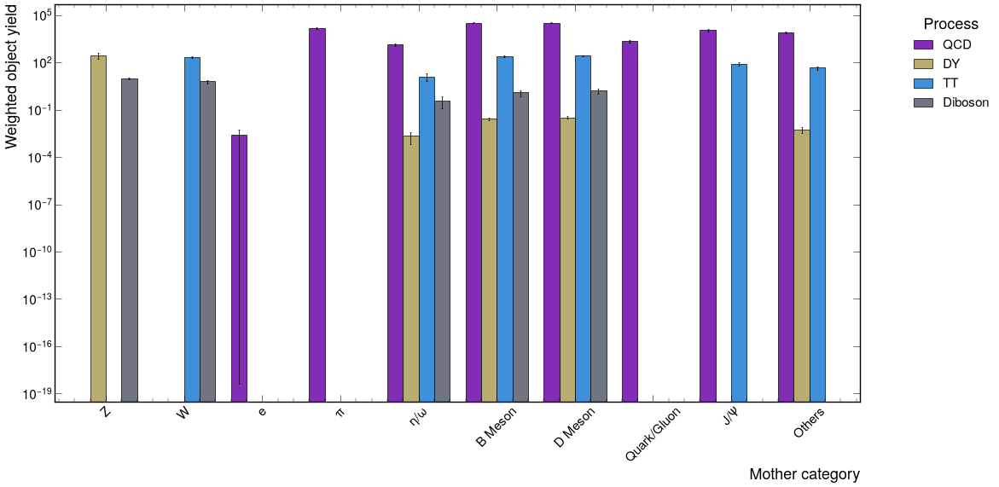

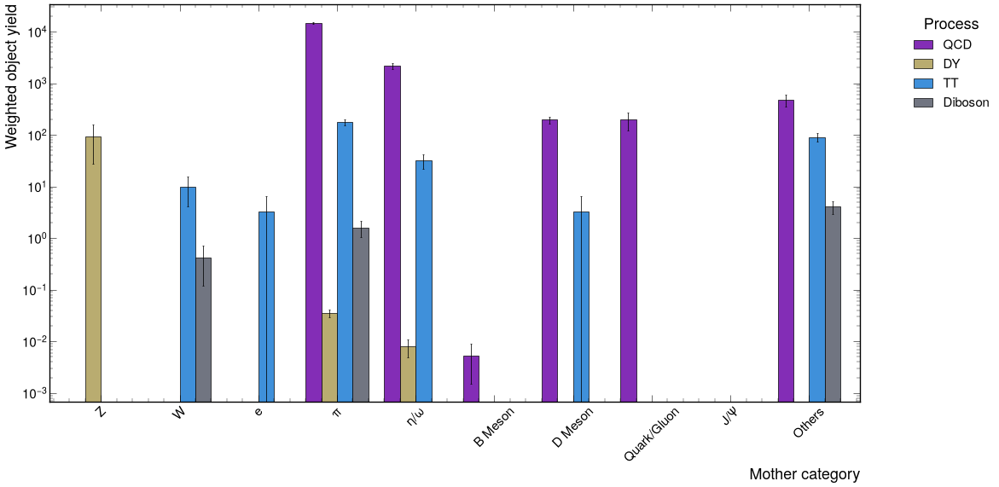

In [14]:
# ============================================================
# Cell 5. Grouped backgrounds only
# QCD / DY / TT / Diboson
# ============================================================

background_tables = {}

for channel in channels:
    print()
    print("=" * 120)
    print(f"Channel: {channel}")
    print("=" * 120)

    make_and_show_background_set(
        output=out,
        sample_groups=background_groups,
        channel=channel,
        # set_label="grouped background",
        set_label=None,
        table_store=background_tables,
        figsize=(24, 12),
    )


Channel: data_control_region_1muLj_cosmic_veto

------------------------------------------------------------------------------------------------------------------------
data_control_region_1muLj_cosmic_veto: QCD sub-process
------------------------------------------------------------------------------------------------------------------------


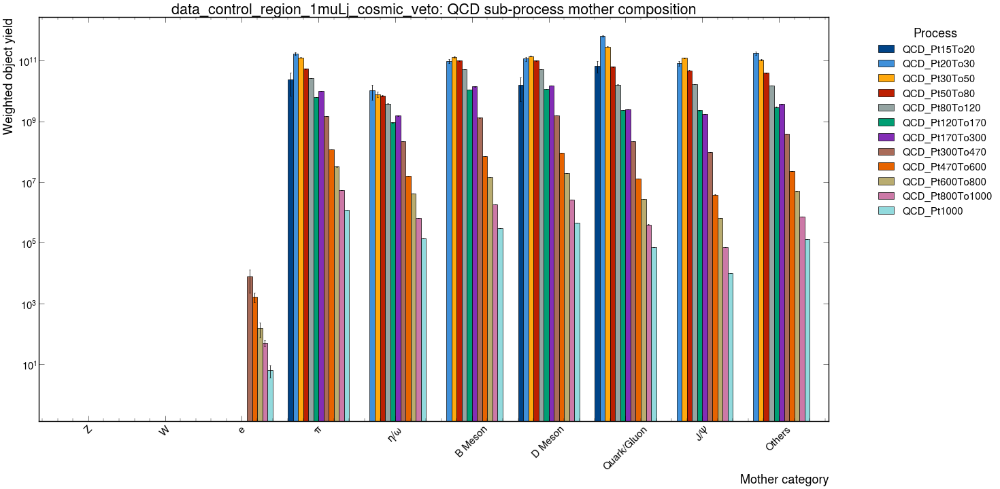

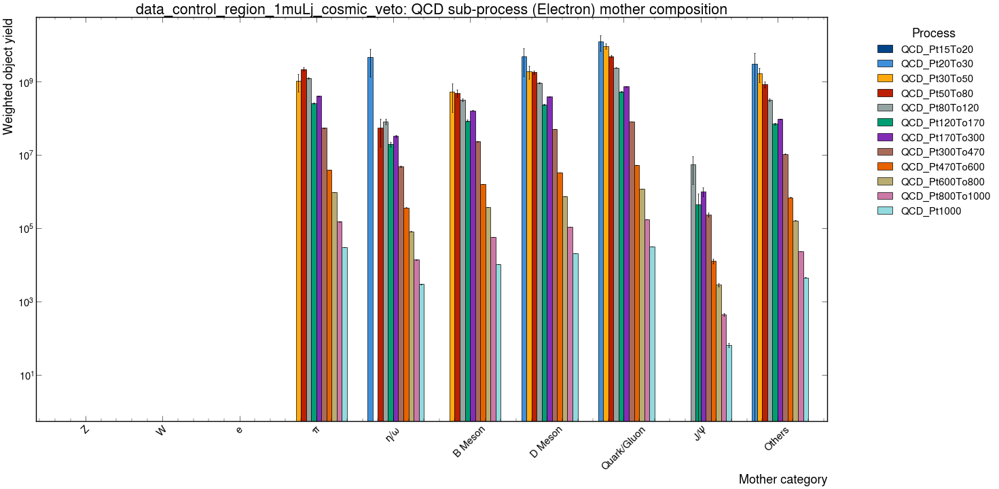

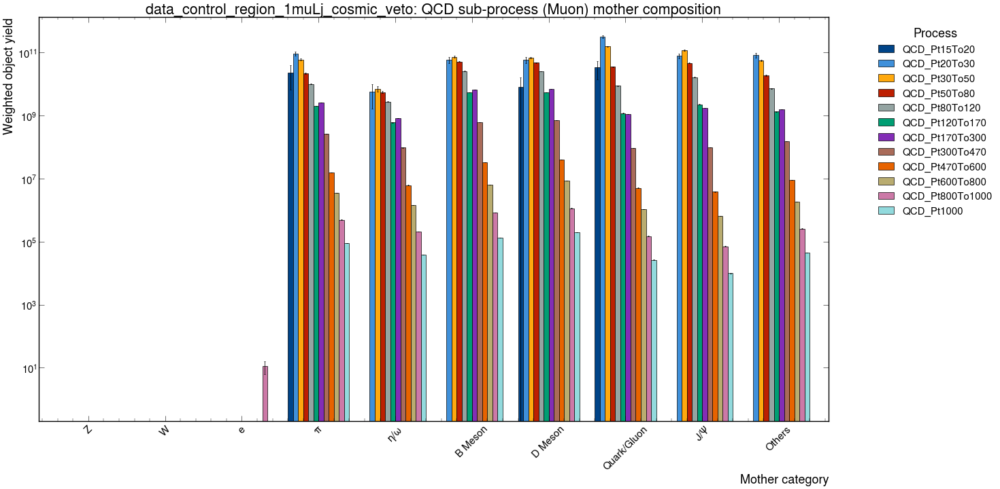

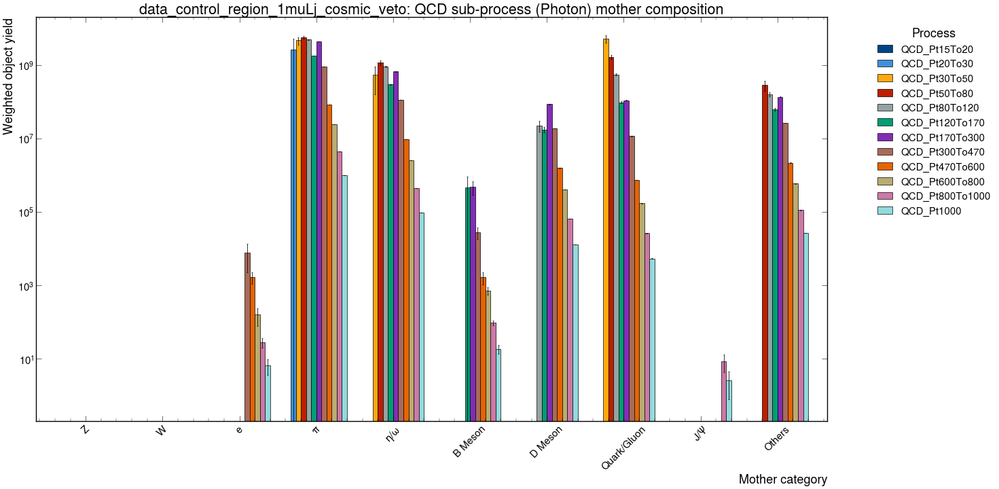


Channel: data_control_region_1egmLj_cosmic_veto

------------------------------------------------------------------------------------------------------------------------
data_control_region_1egmLj_cosmic_veto: QCD sub-process
------------------------------------------------------------------------------------------------------------------------


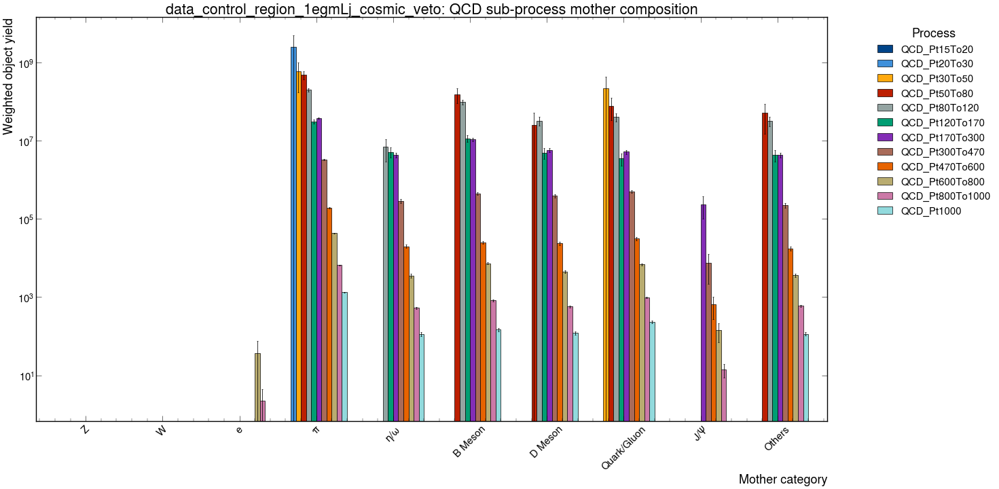

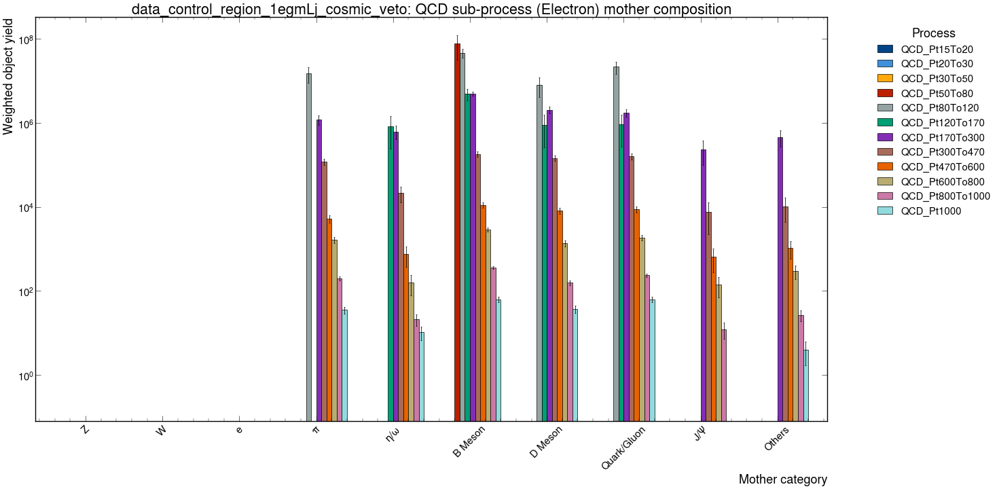

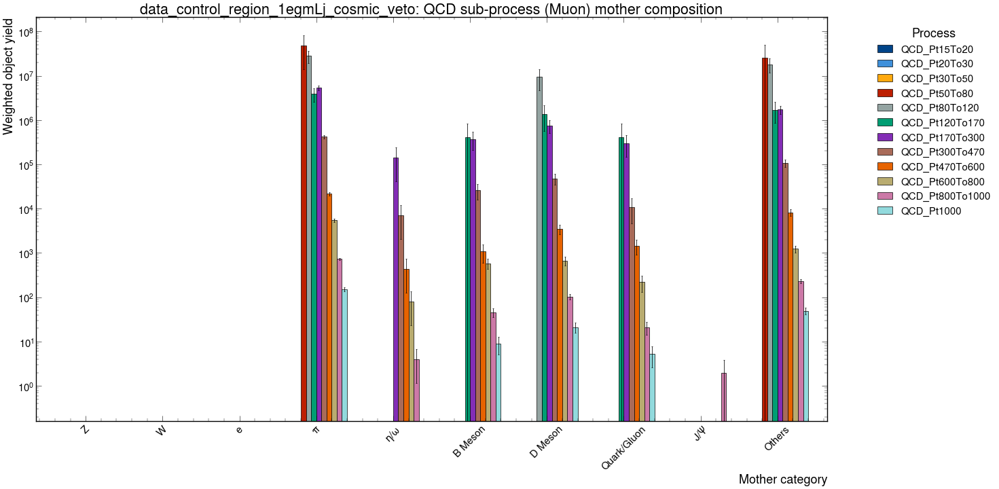

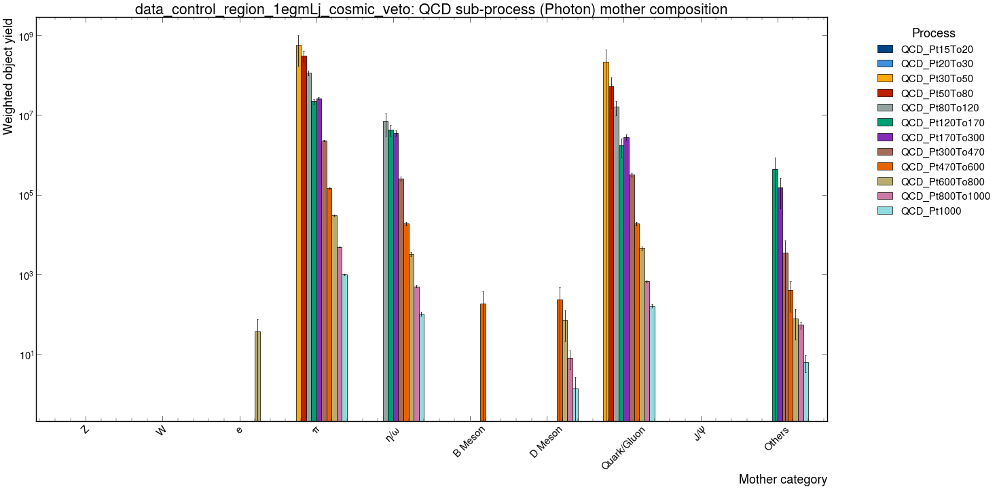


Channel: data_control_region_1muLj_1egmLj_cosmic_veto

------------------------------------------------------------------------------------------------------------------------
data_control_region_1muLj_1egmLj_cosmic_veto: QCD sub-process
------------------------------------------------------------------------------------------------------------------------


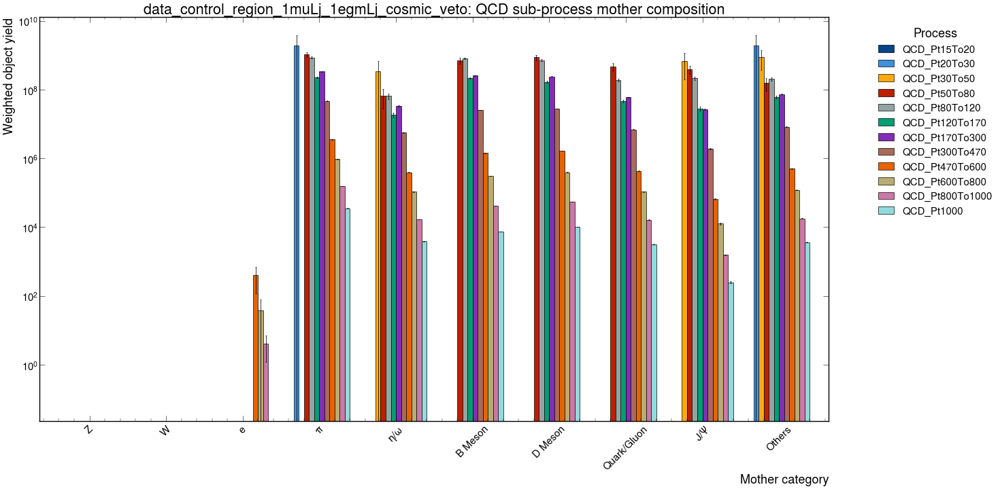

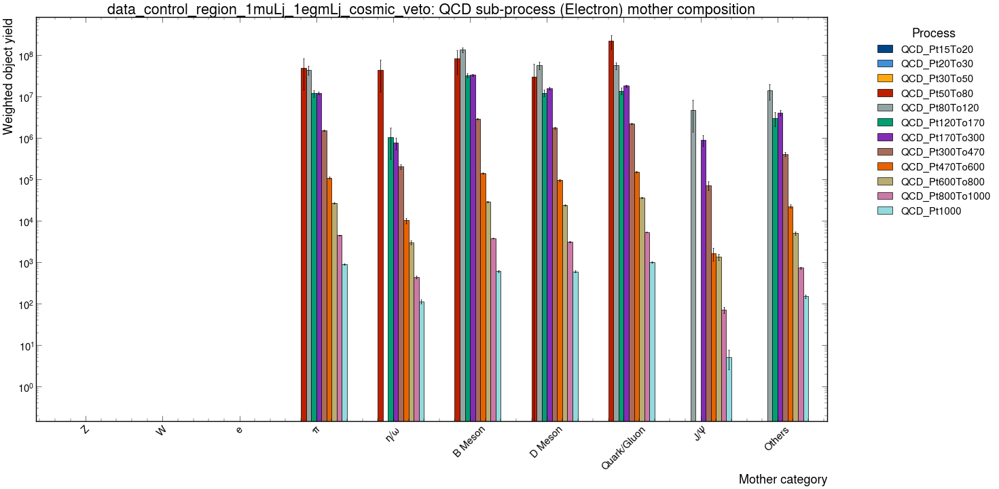

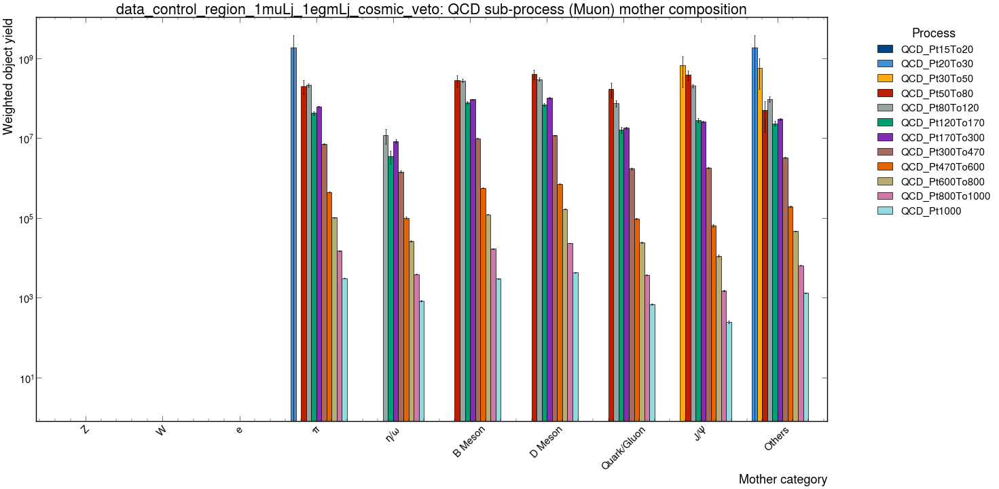

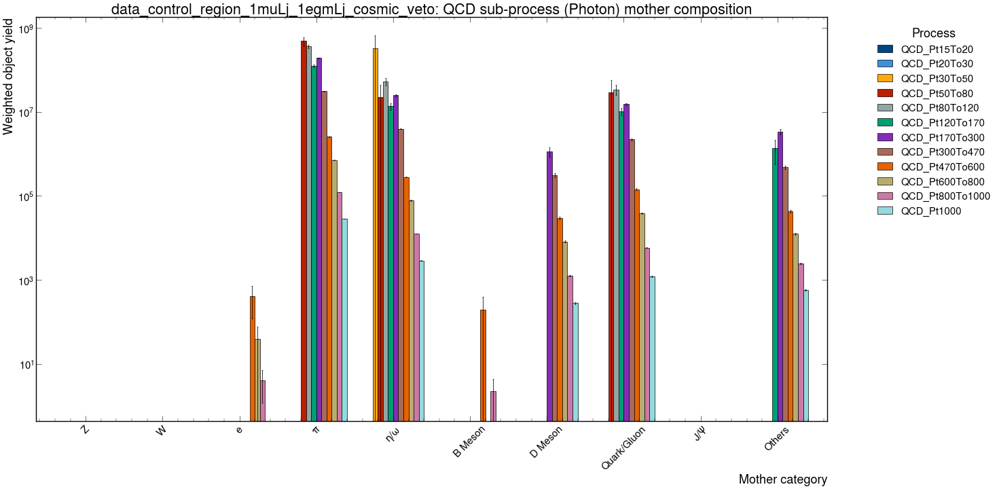


Channel: data_control_region_2muLj_cosmic_veto

------------------------------------------------------------------------------------------------------------------------
data_control_region_2muLj_cosmic_veto: QCD sub-process
------------------------------------------------------------------------------------------------------------------------


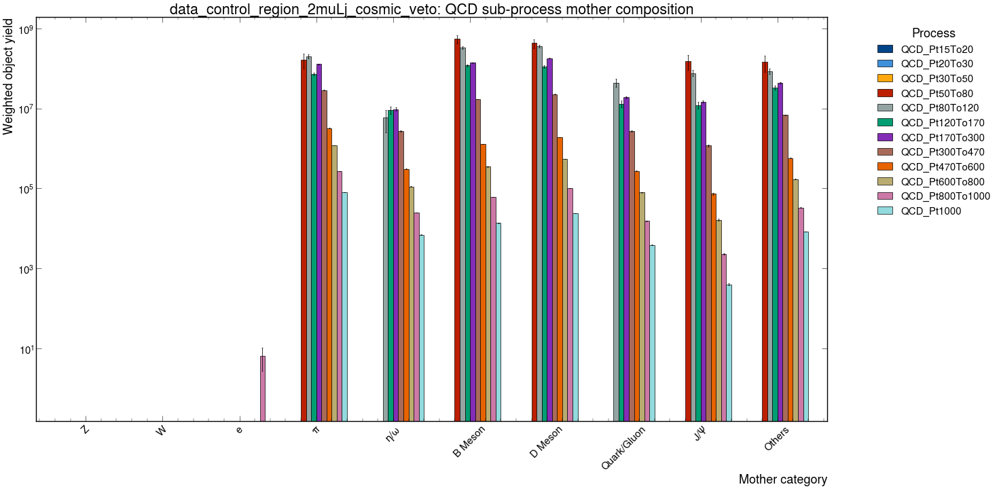

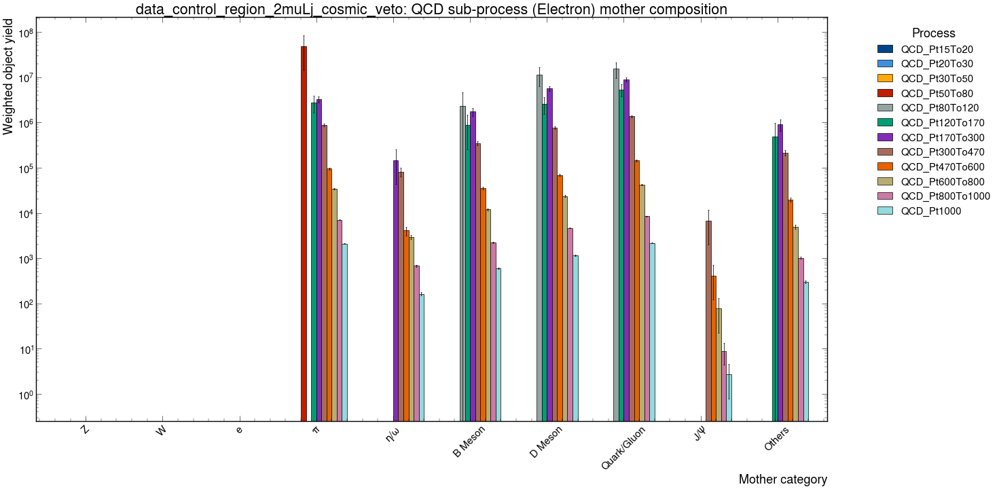

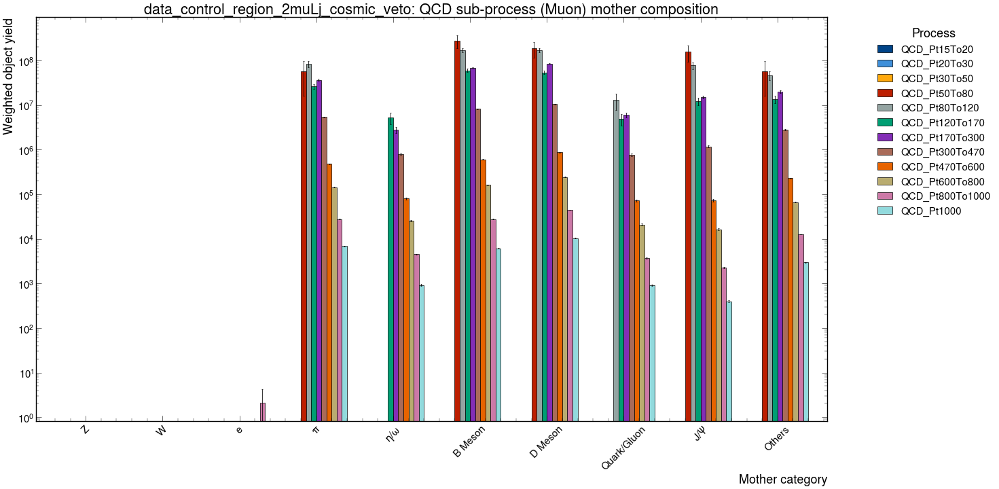

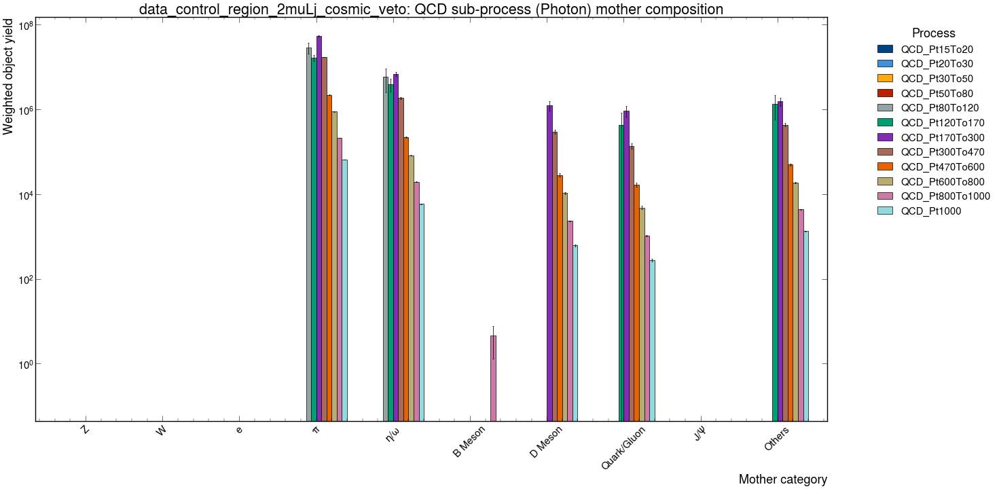

In [13]:
# ============================================================
# Cell 6. QCD sub-processes only
# QCD_Pt20To30 / QCD_Pt30To50 / ...
# ============================================================

qcd_process_tables = {}

for channel in channels:
    print()
    print("=" * 120)
    print(f"Channel: {channel}")
    print("=" * 120)

    make_and_show_background_set(
        output=out,
        sample_groups=qcd_process_groups,
        channel=channel,
        set_label="QCD sub-process",
        table_store=qcd_process_tables,
        figsize=(30, 15),
    )


Channel: data_control_region_1muLj_cosmic_veto

------------------------------------------------------------------------------------------------------------------------
data_control_region_1muLj_cosmic_veto: non-QCD sub-process
------------------------------------------------------------------------------------------------------------------------


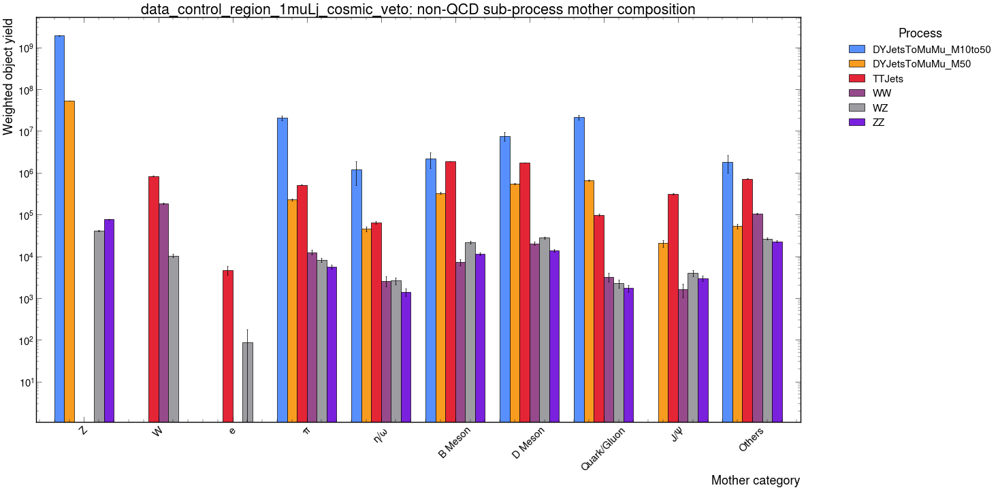

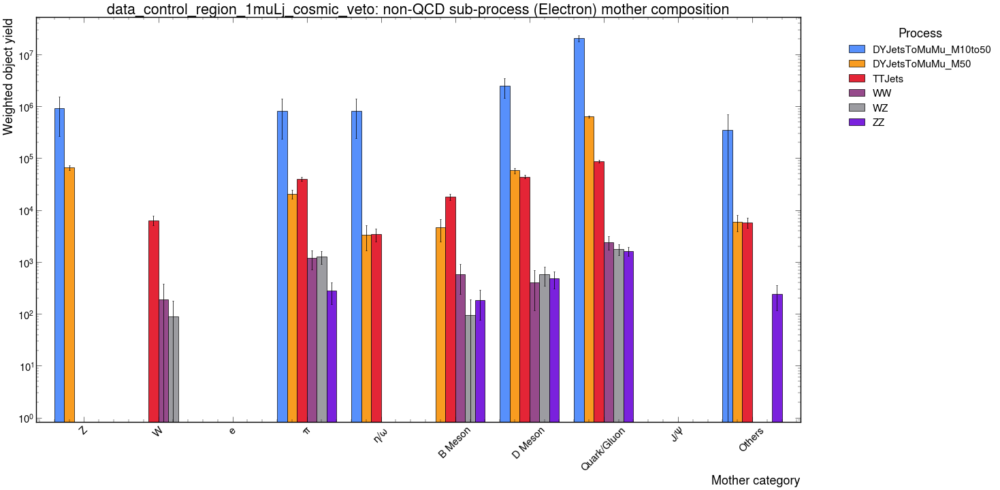

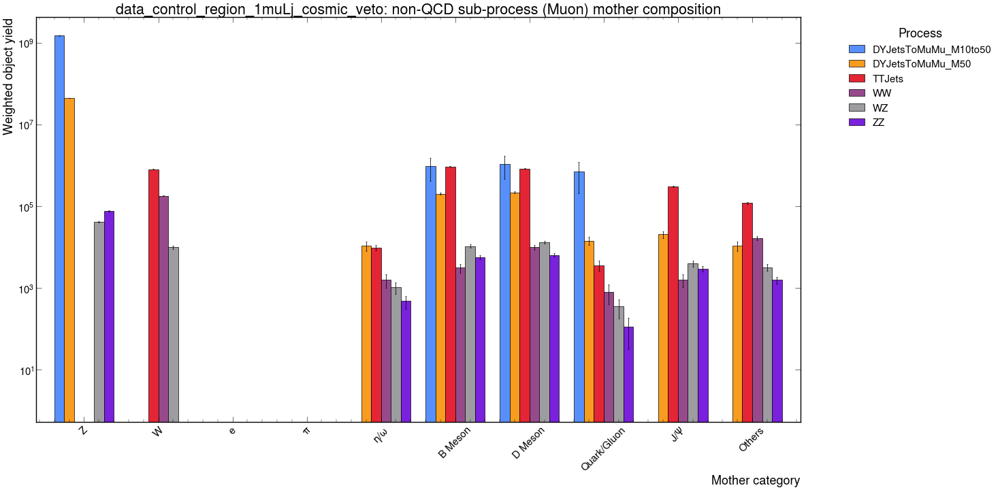

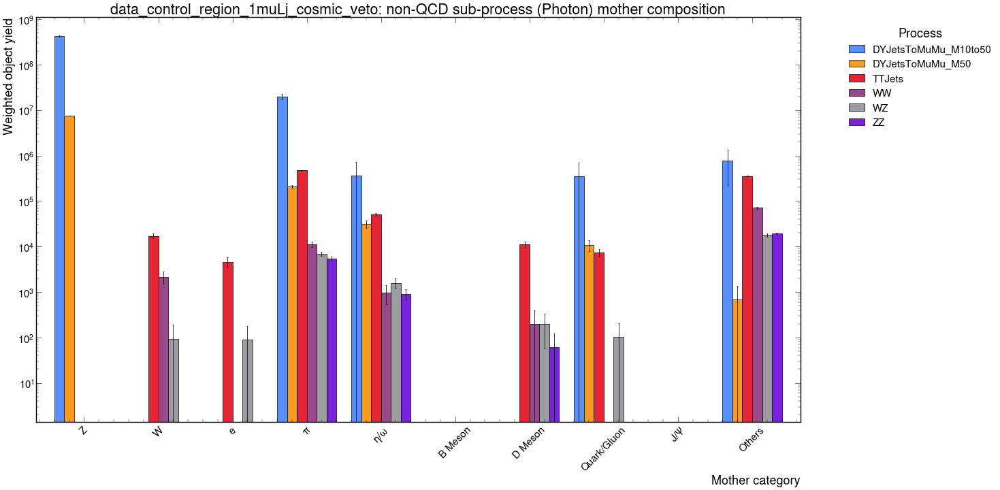


Channel: data_control_region_1egmLj_cosmic_veto

------------------------------------------------------------------------------------------------------------------------
data_control_region_1egmLj_cosmic_veto: non-QCD sub-process
------------------------------------------------------------------------------------------------------------------------


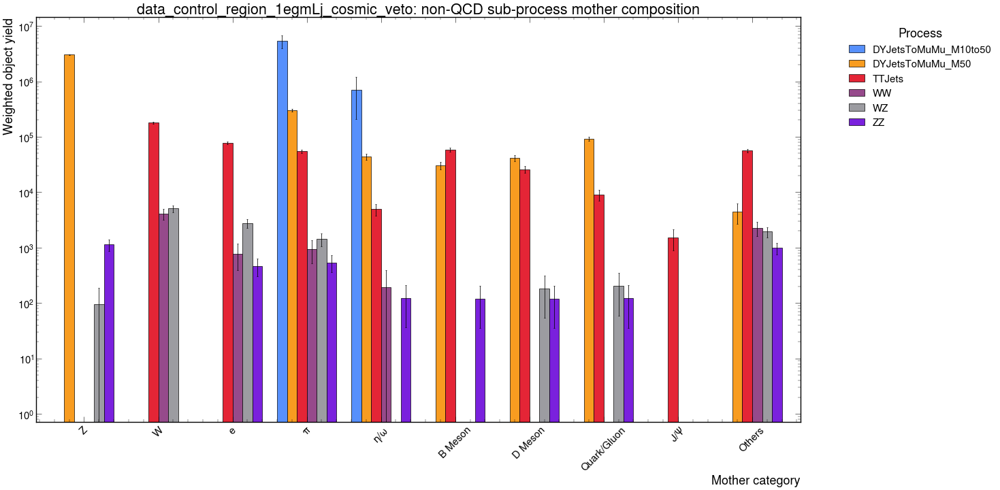

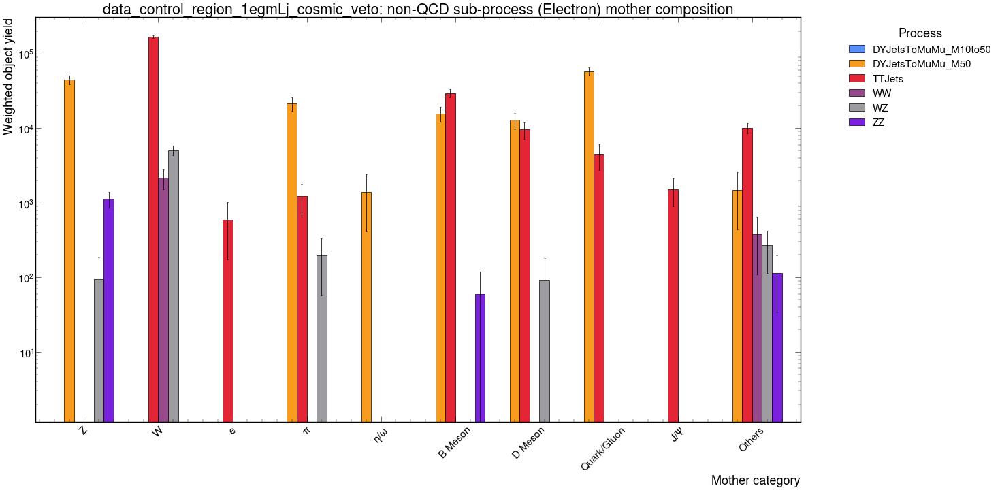

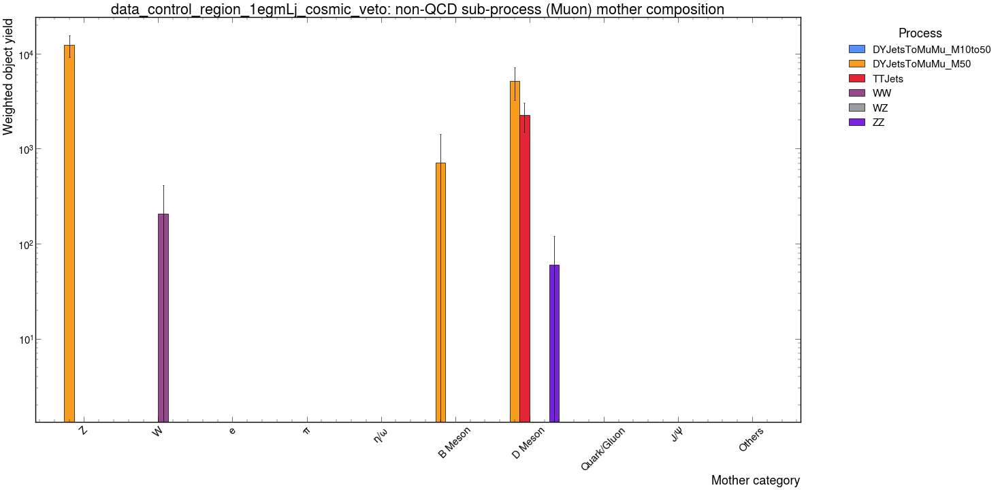

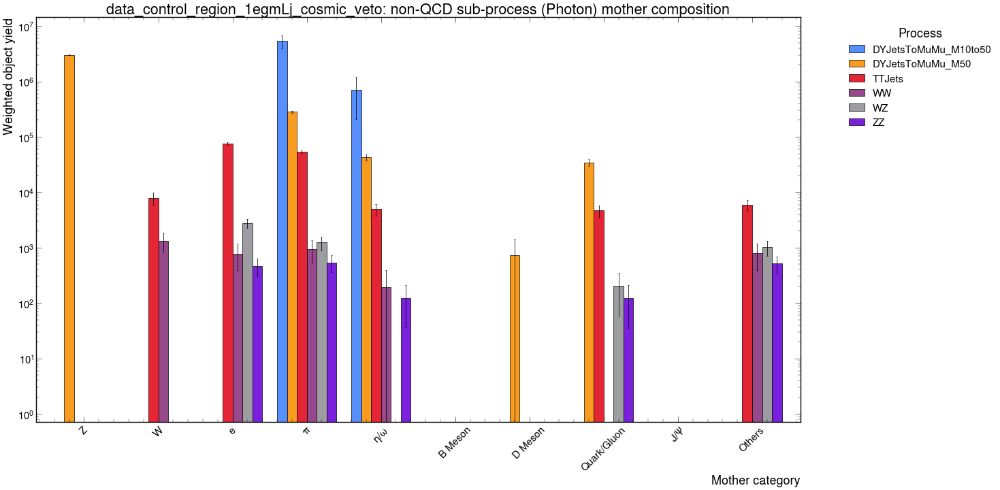


Channel: data_control_region_1muLj_1egmLj_cosmic_veto

------------------------------------------------------------------------------------------------------------------------
data_control_region_1muLj_1egmLj_cosmic_veto: non-QCD sub-process
------------------------------------------------------------------------------------------------------------------------


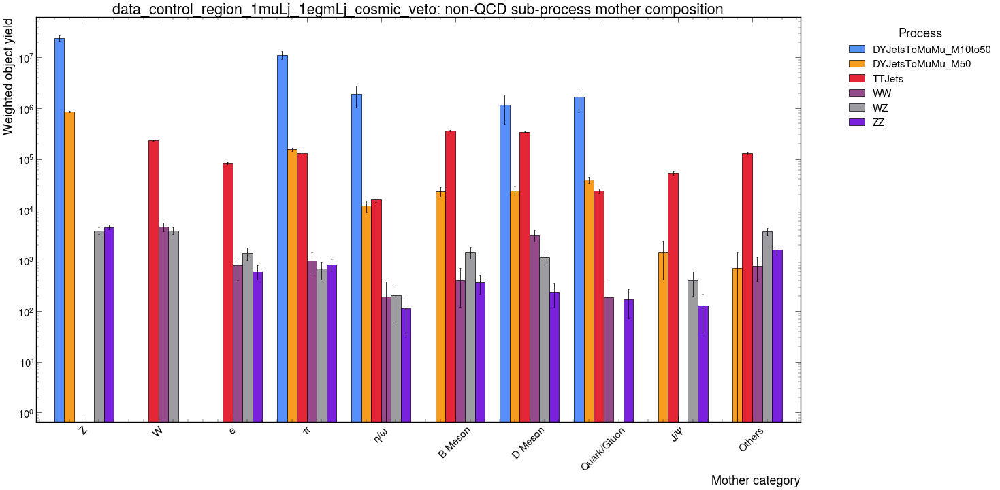

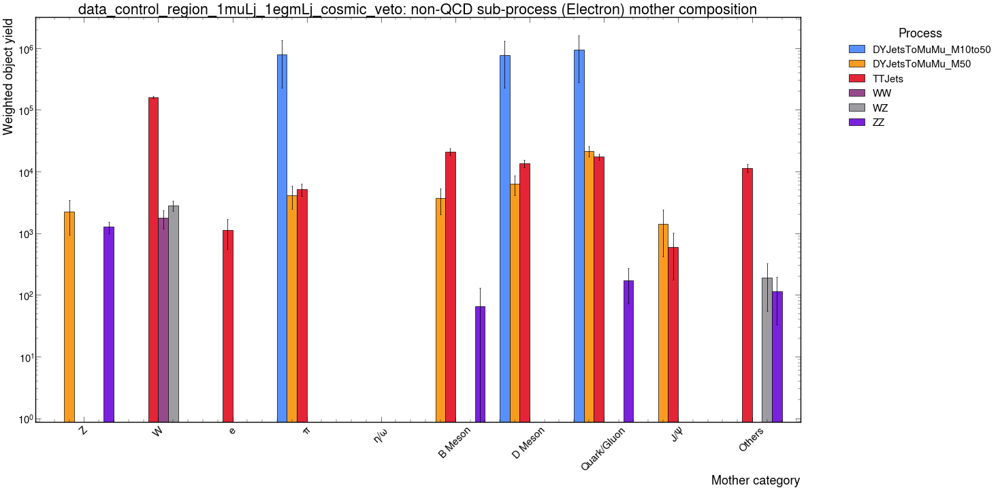

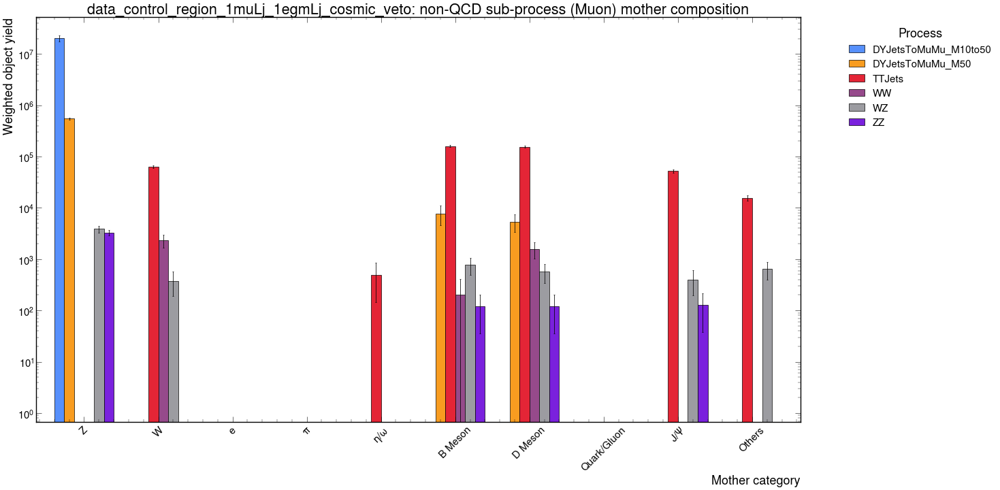

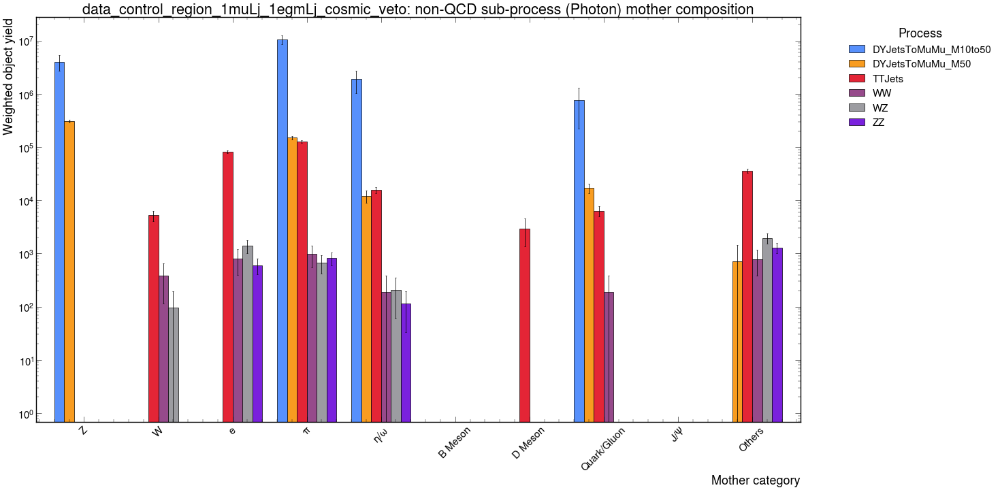


Channel: data_control_region_2muLj_cosmic_veto

------------------------------------------------------------------------------------------------------------------------
data_control_region_2muLj_cosmic_veto: non-QCD sub-process
------------------------------------------------------------------------------------------------------------------------


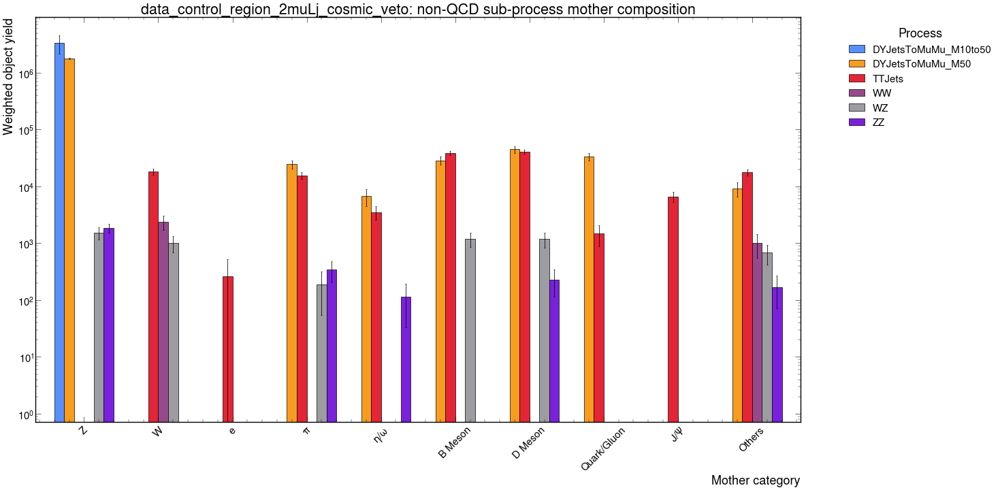

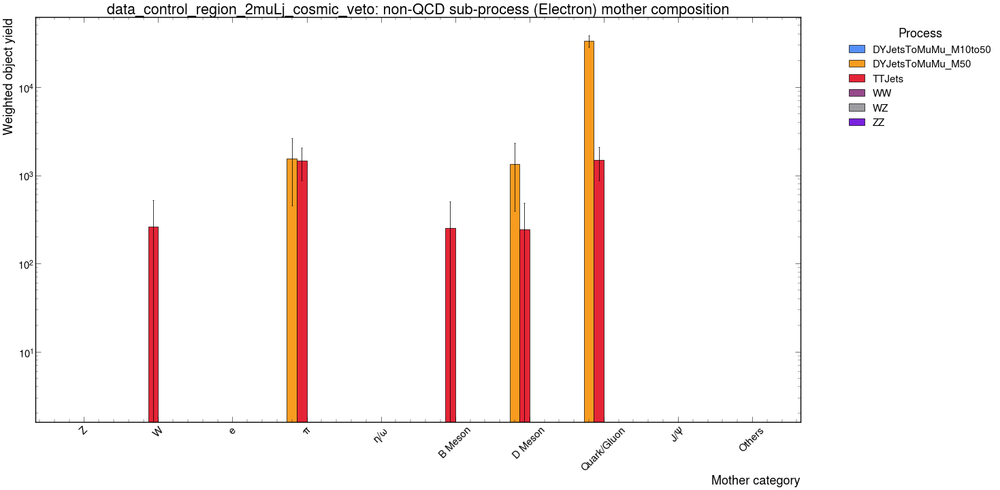

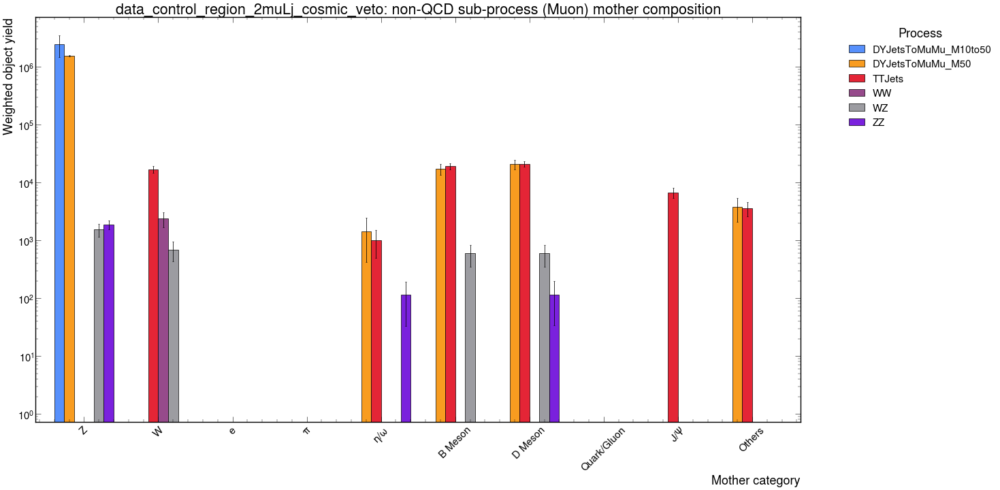

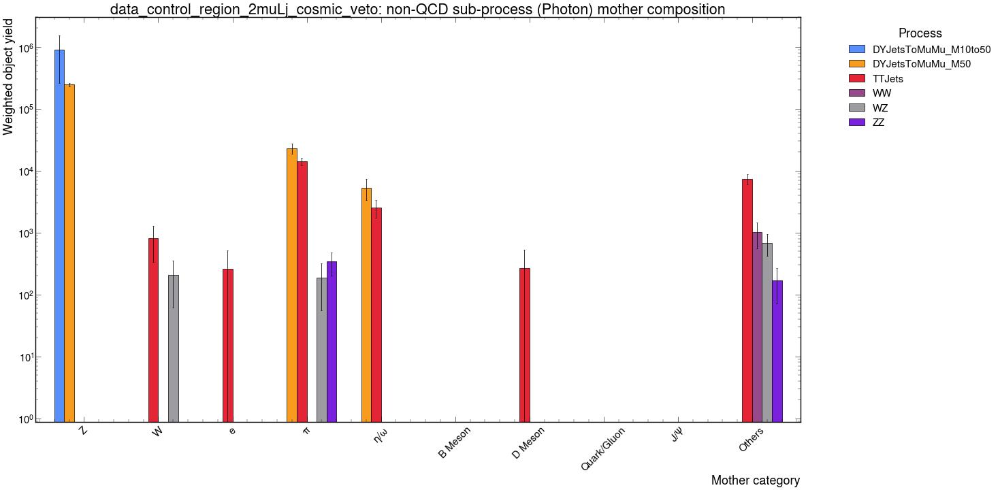

In [15]:
# ============================================================
# Cell 7. Non-QCD sub-processes only
# DY / TT / WW / WZ / ZZ
# ============================================================

nonqcd_process_tables = {}

for channel in channels:
    print()
    print("=" * 120)
    print(f"Channel: {channel}")
    print("=" * 120)

    make_and_show_background_set(
        output=out,
        sample_groups=nonqcd_process_groups,
        channel=channel,
        set_label="non-QCD sub-process",
        table_store=nonqcd_process_tables,
        figsize=(30, 15),
    )

In [12]:
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
pd.set_option("display.max_colwidth", None)

def _is_int_like(x):
    try:
        int(x)
        return True
    except Exception:
        return False


def iter_other_counts(other_obj):
    """
    Yield (process, pdgid, yield) from either:
      - dict: {process: {pdgid: yield}}
      - DataFrame with index=pdgid, columns=process
      - DataFrame with index=process, columns=pdgid
    """
    if isinstance(other_obj, pd.DataFrame):
        index_is_pdgid = all(_is_int_like(x) for x in other_obj.index)
        columns_are_pdgid = all(_is_int_like(x) for x in other_obj.columns)

        if index_is_pdgid and not columns_are_pdgid:
            # rows = pdgid, columns = process
            for process in other_obj.columns:
                for pdgid, yield_value in other_obj[process].items():
                    yield process, pdgid, yield_value

        elif columns_are_pdgid and not index_is_pdgid:
            # rows = process, columns = pdgid
            for process, row in other_obj.iterrows():
                for pdgid, yield_value in row.items():
                    yield process, pdgid, yield_value

        else:
            # fallback: assume rows=pdgid, columns=process
            for process in other_obj.columns:
                for pdgid, yield_value in other_obj[process].items():
                    yield process, pdgid, yield_value

    else:
        # expected dict case: {process: {pdgid: yield}}
        for process, other_counts in other_obj.items():
            if isinstance(other_counts, pd.Series):
                iterable = other_counts.items()
            else:
                iterable = other_counts.items()

            for pdgid, yield_value in iterable:
                yield process, pdgid, yield_value


def make_other_pdgid_table(table_store, top_n=None, min_yield=0):
    rows = []

    for channel, channel_payload in table_store.items():
        if isinstance(channel_payload, dict) and "other" in channel_payload:
            table_sets = {"": channel_payload}
        else:
            table_sets = channel_payload

        for set_label, payload in table_sets.items():
            if not isinstance(payload, dict) or "other" not in payload:
                continue

            entries = []
            for process, pdgid, yield_value in iter_other_counts(payload["other"]):
                if pd.isna(yield_value) or yield_value <= min_yield:
                    continue

                entries.append((process, pdgid, yield_value))

            if top_n is not None:
                grouped = defaultdict(list)
                for process, pdgid, yield_value in entries:
                    grouped[process].append((pdgid, yield_value))

                entries = []
                for process, items in grouped.items():
                    for pdgid, yield_value in sorted(items, key=lambda x: x[1], reverse=True)[:top_n]:
                        entries.append((process, pdgid, yield_value))

            for process, pdgid, yield_value in entries:
                rows.append({
                    "channel": channel,
                    "set": set_label,
                    "process": process,
                    "mother_pdgid": int(pdgid),
                    "abs_mother_pdgid": abs(int(pdgid)),
                    "yield": float(yield_value),
                })

    return pd.DataFrame(rows)


def display_other_pdgid_tables(table_stores, top_n=None, min_yield=0):
    for store_name, table_store in table_stores.items():
        other_df = make_other_pdgid_table(
            table_store,
            top_n=top_n,
            min_yield=min_yield,
        )

        display(Markdown(f"## {store_name}: Others mother PDG IDs"))

        if other_df.empty:
            display(Markdown("No `Others` entries found."))
            continue

        other_df = other_df.sort_values("yield",ascending=False,).reset_index(drop=True)
        if top_n is not None:
          other_df = other_df.head(top_n)
        display(other_df)


table_stores_to_check = {}

for name in [
    "qcd_process_tables",
    "nonqcd_process_tables",
]:
    if name in globals():
        table_stores_to_check[name] = globals()[name]

display_other_pdgid_tables(
    table_stores_to_check,
    top_n=50,
    min_yield=1e-6,
)


grouped background: Inclusive


/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


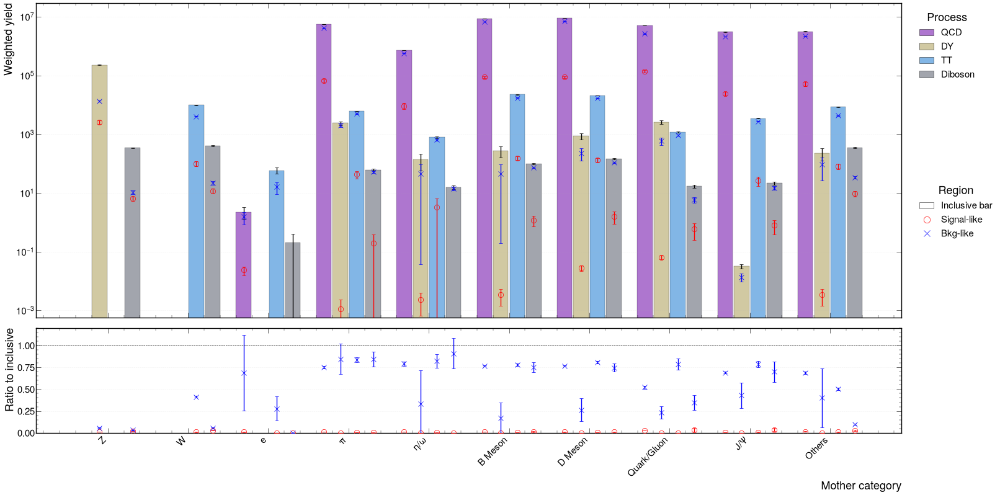

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


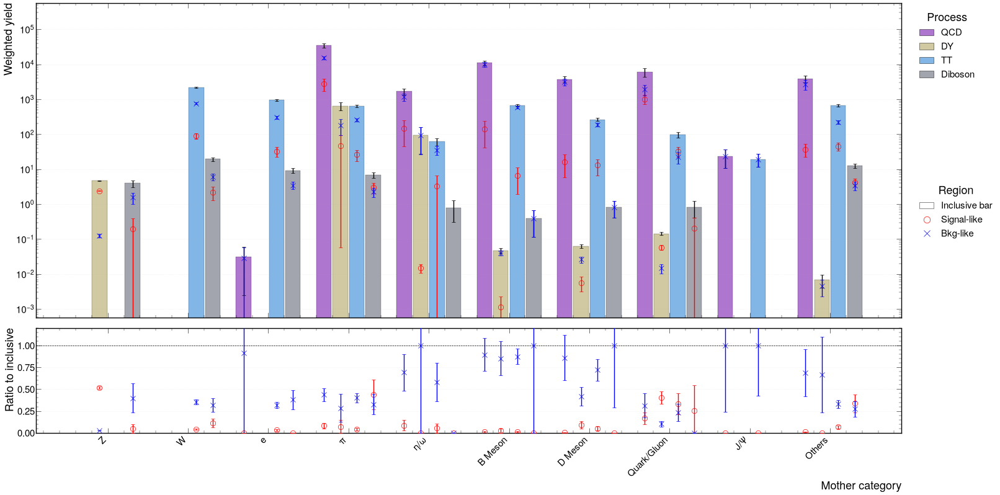

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


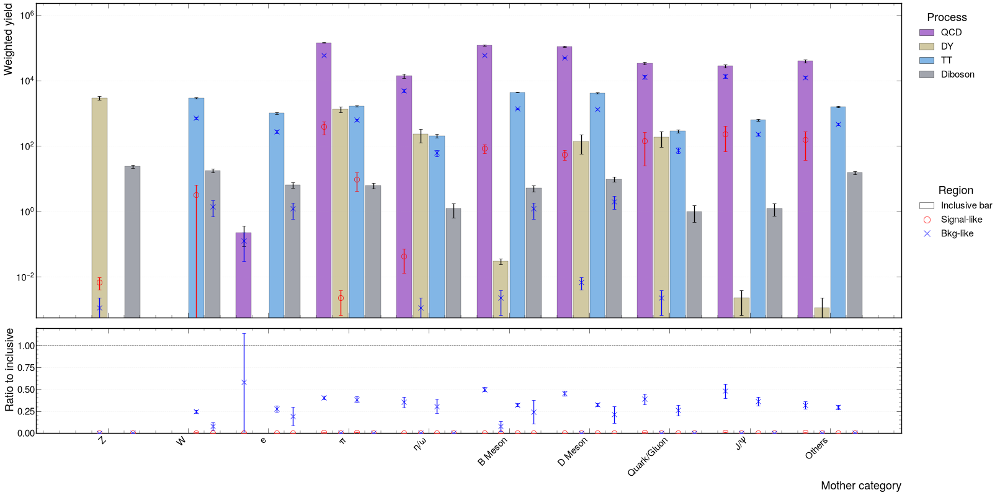

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


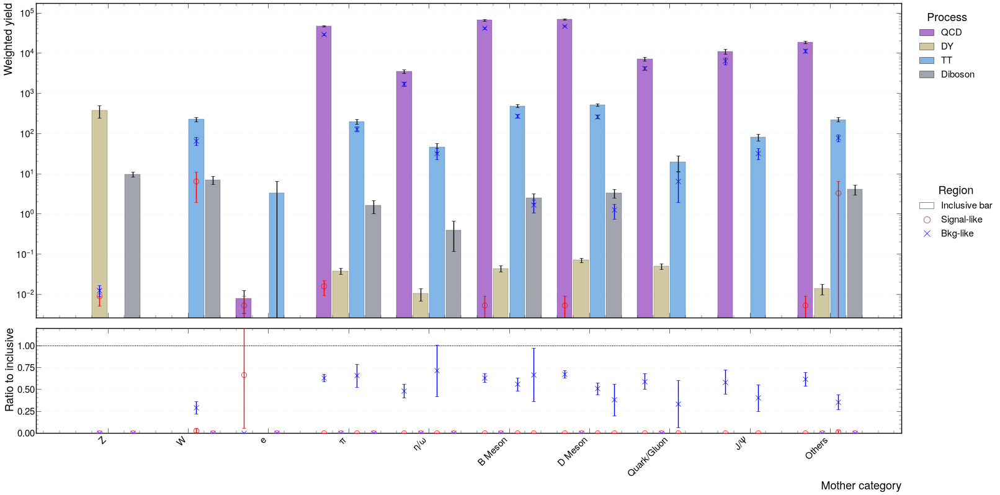


grouped background: Electron


/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


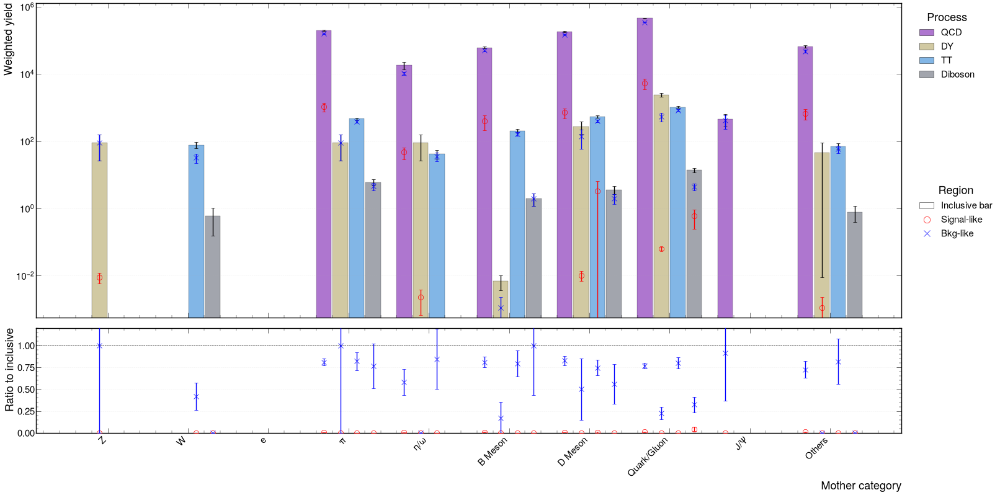

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


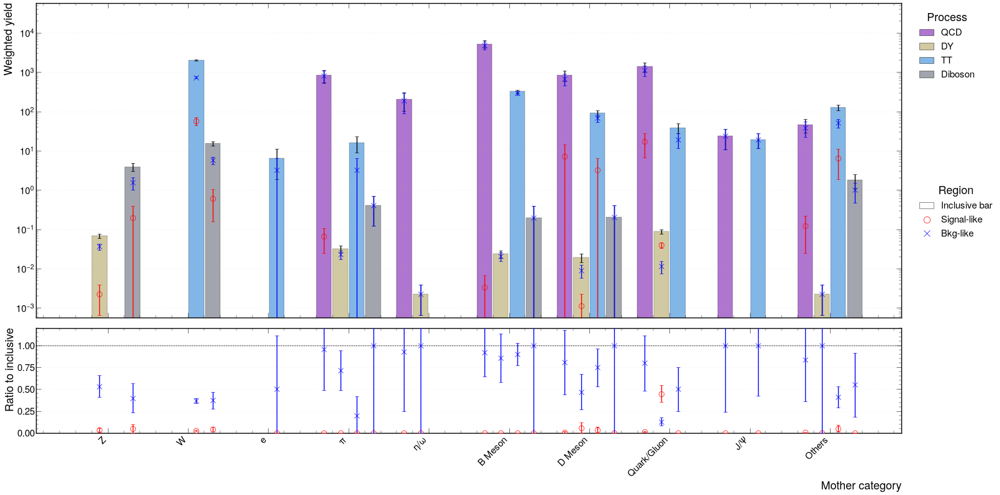

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


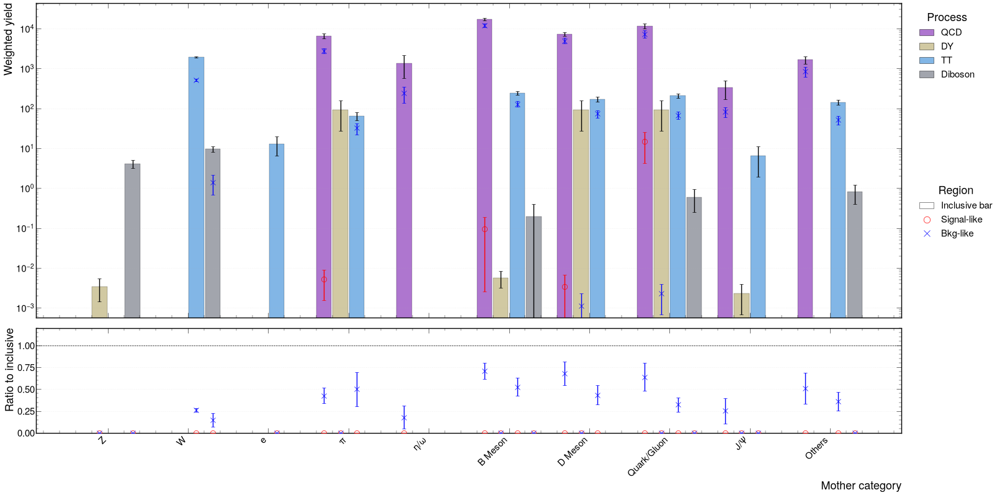

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


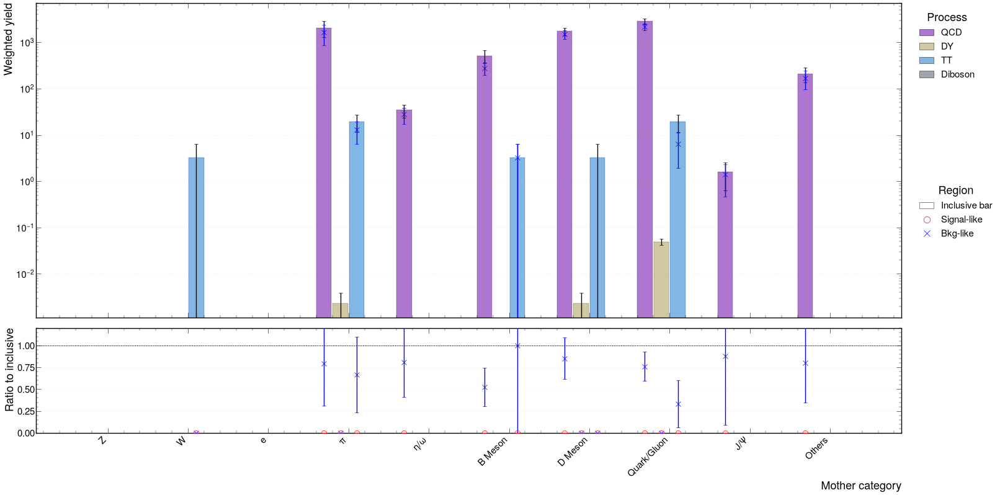


grouped background: Muon


/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


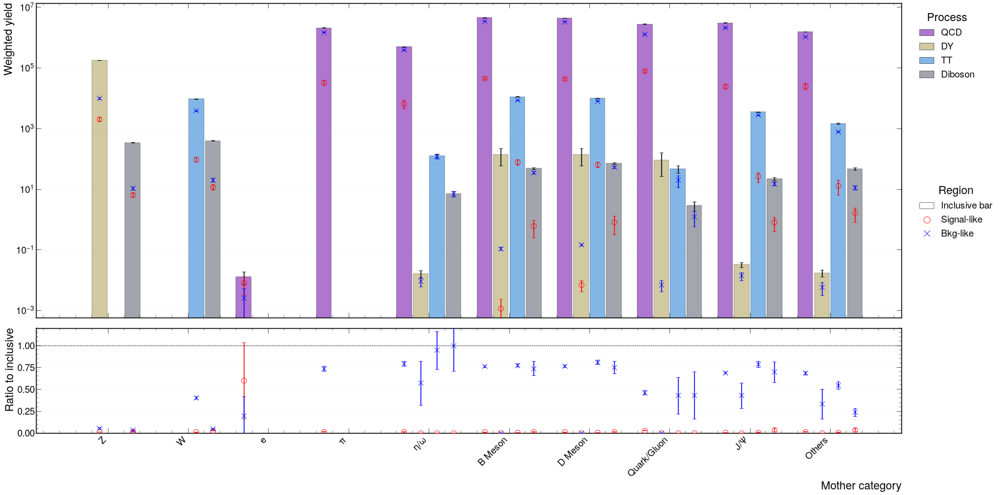

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


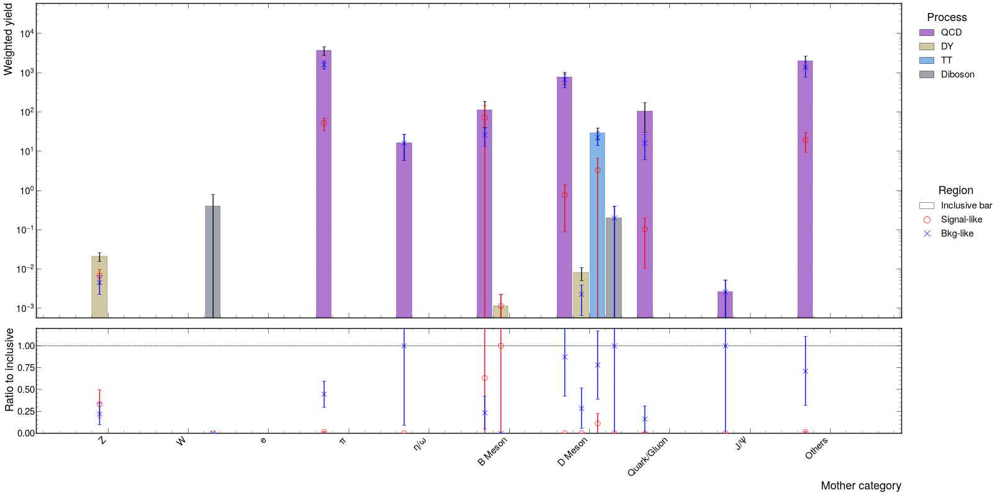

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


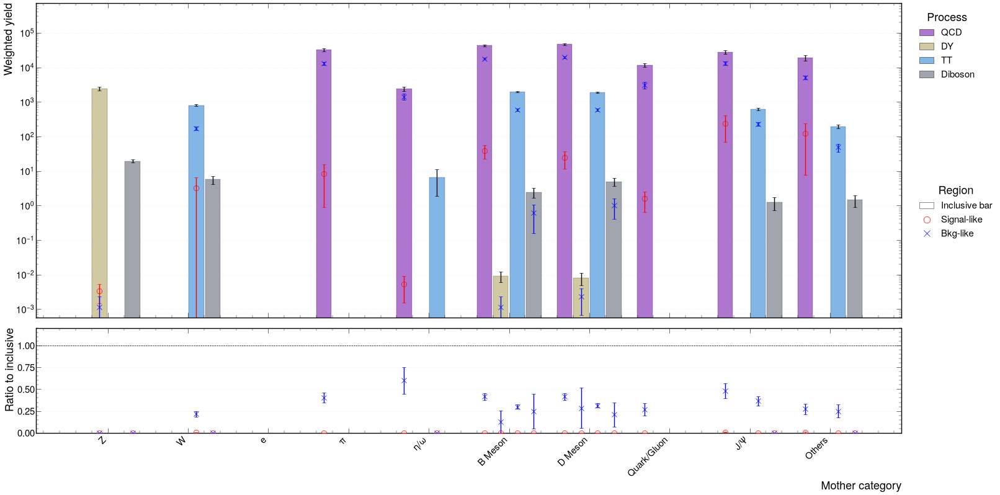

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


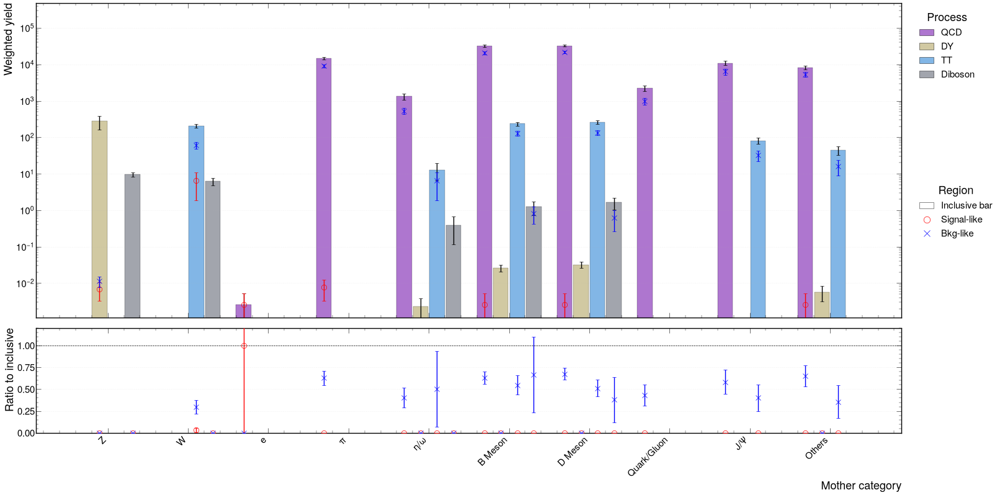


grouped background: Photon


/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


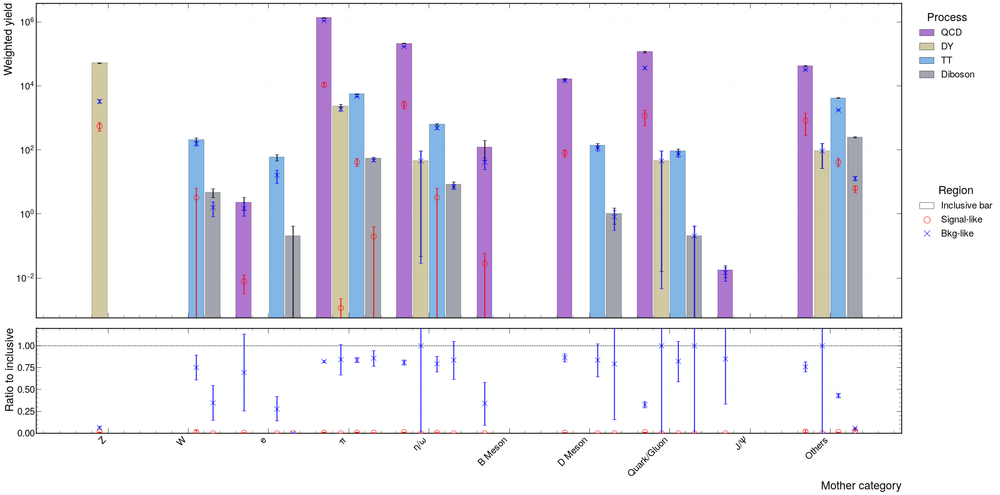

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


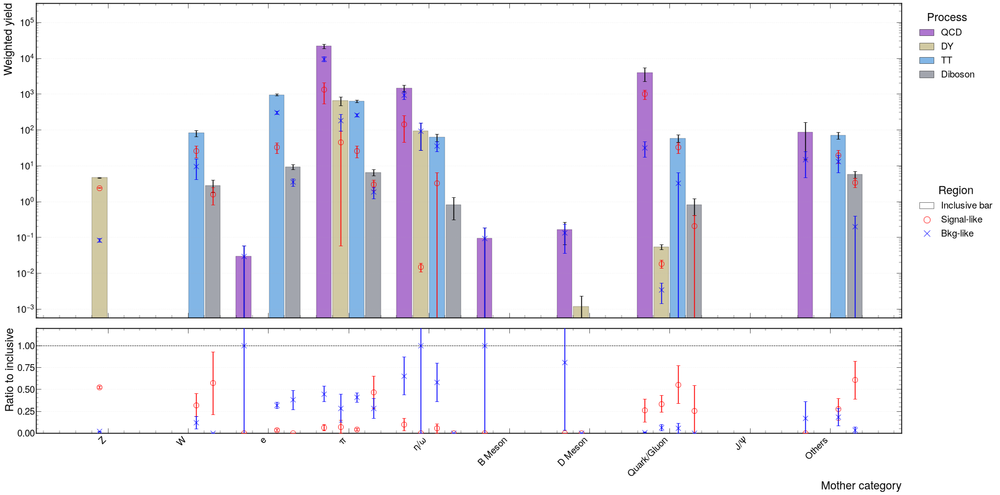

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


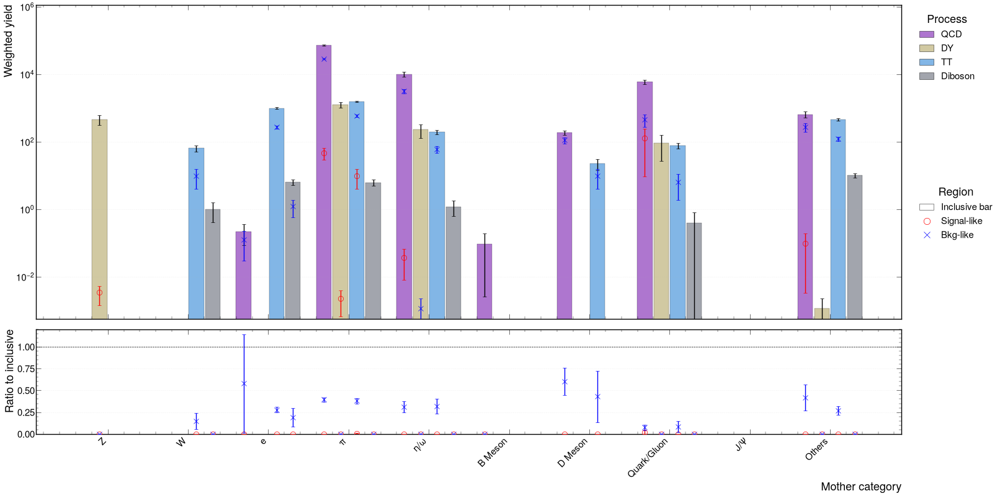

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


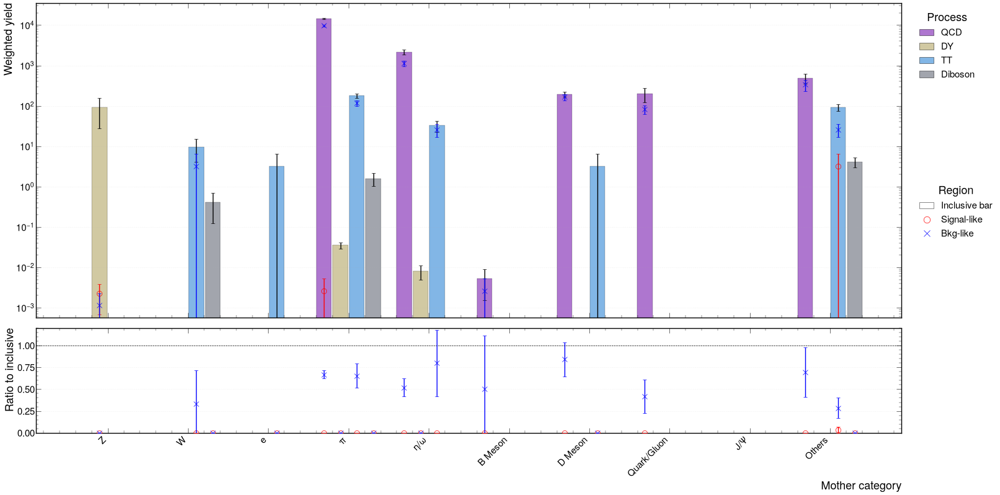


QCD sub-process: Inclusive


/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


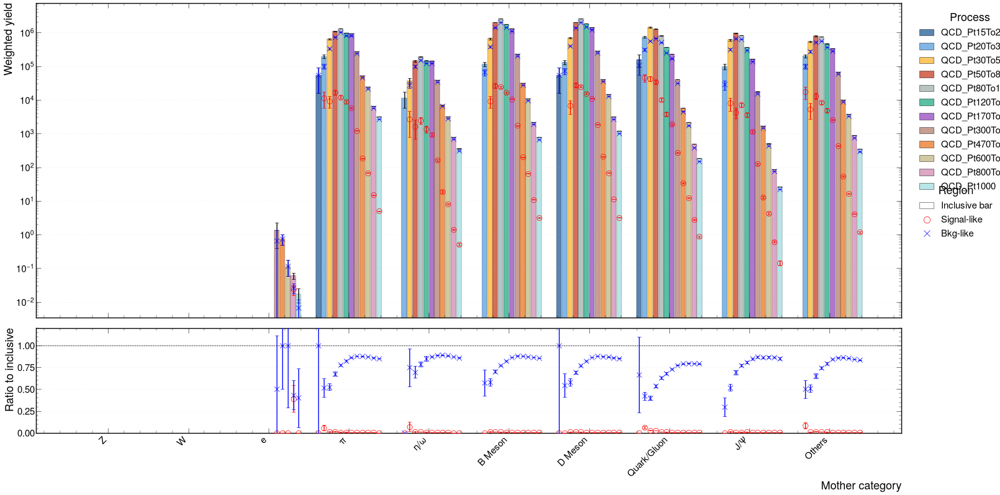

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


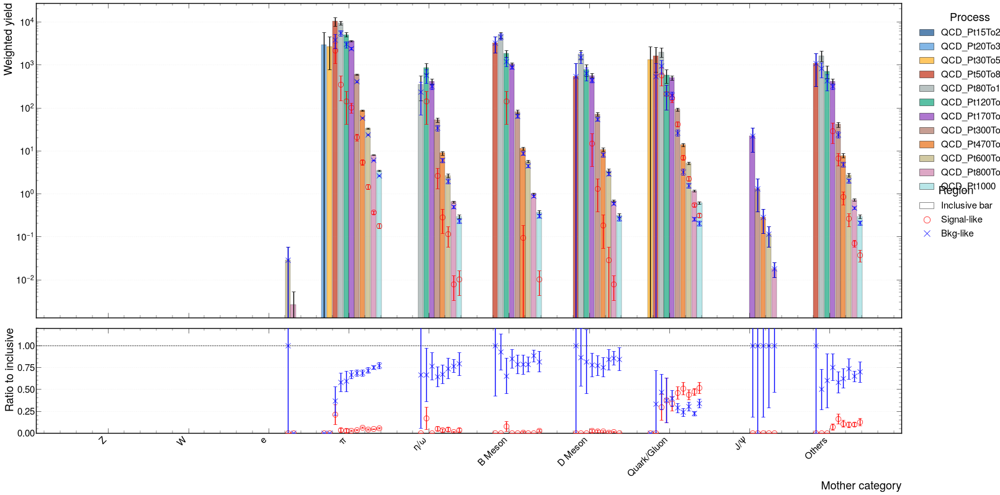

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


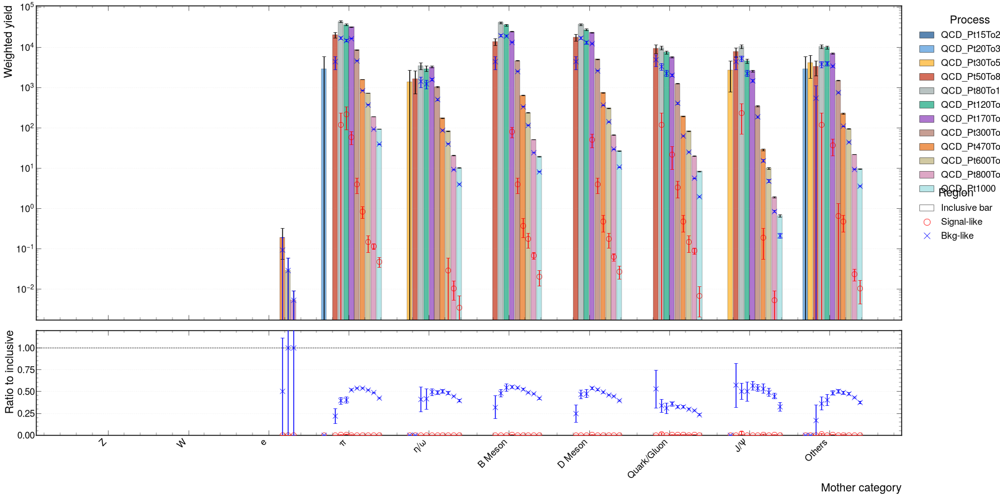

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


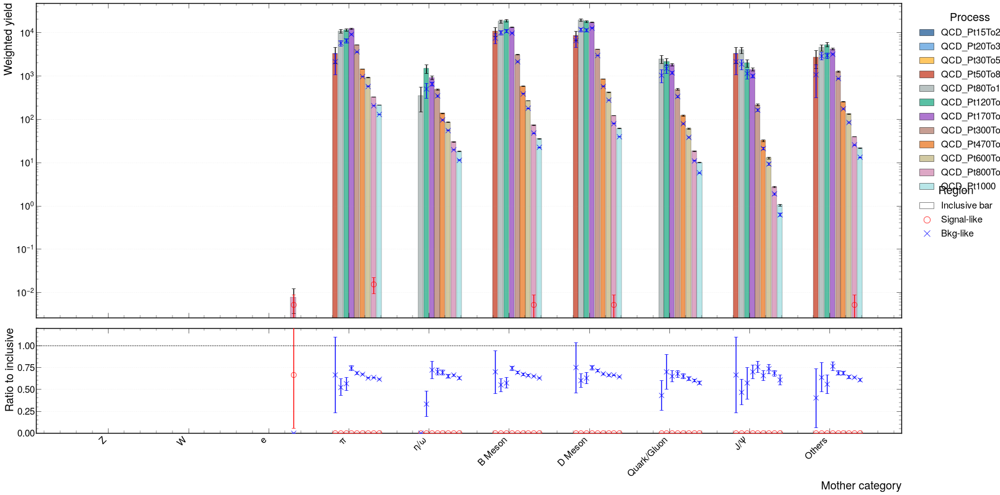


QCD sub-process: Electron


/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


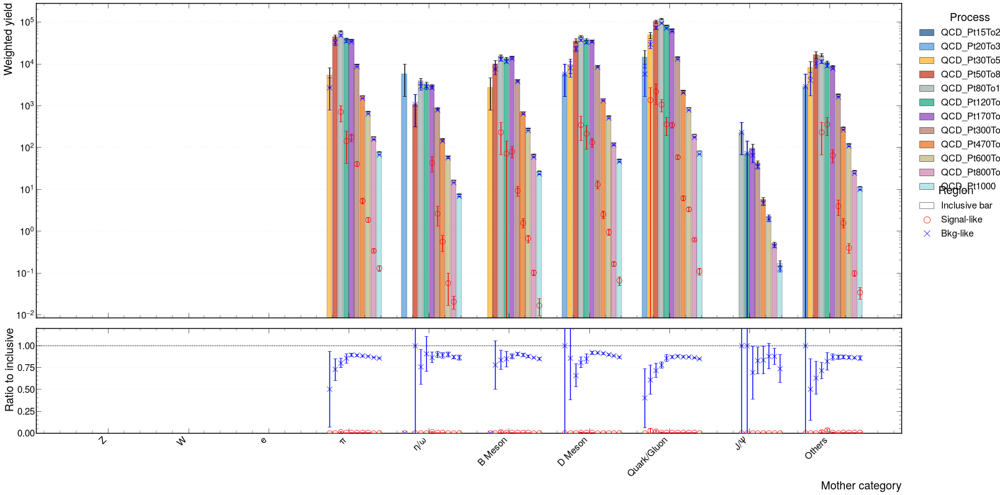

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


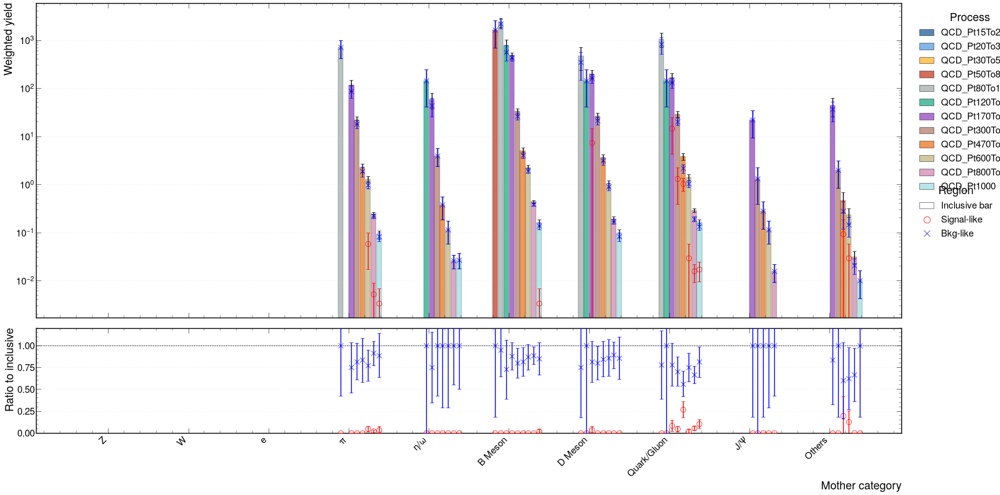

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


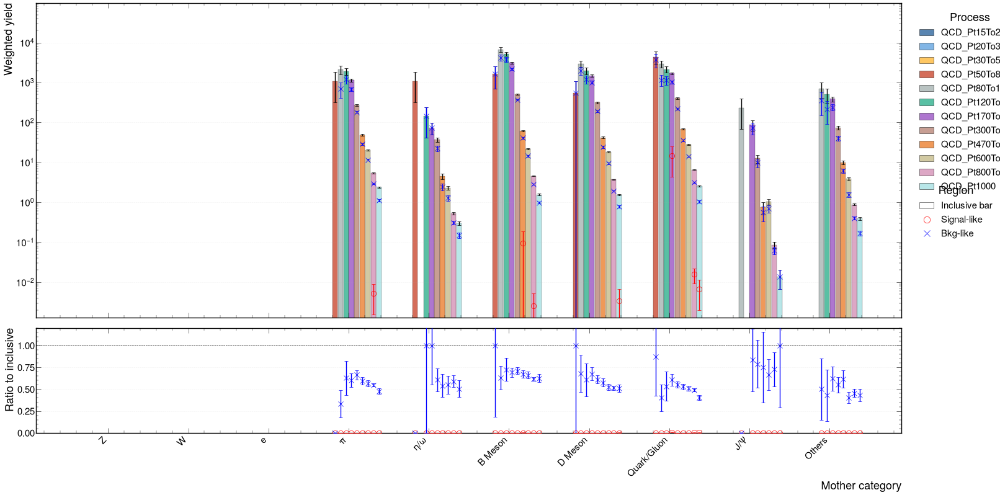

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


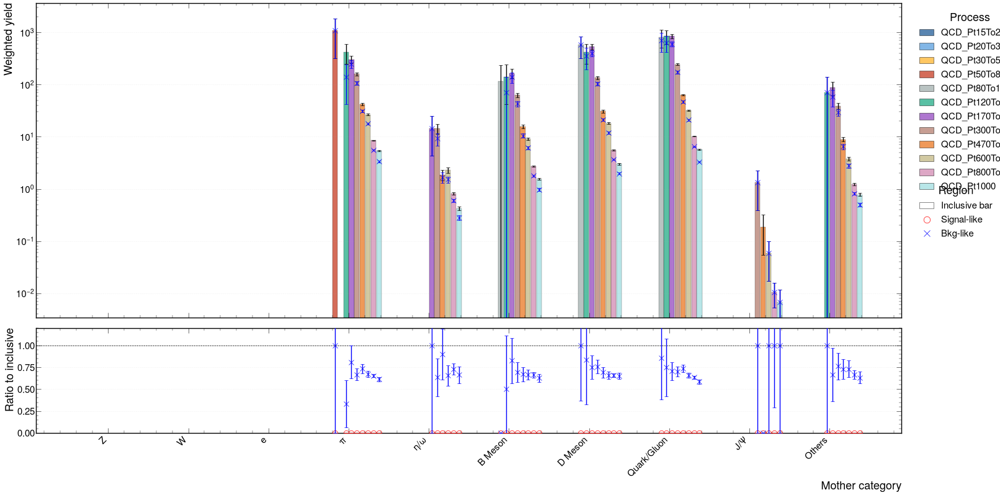


QCD sub-process: Muon


/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


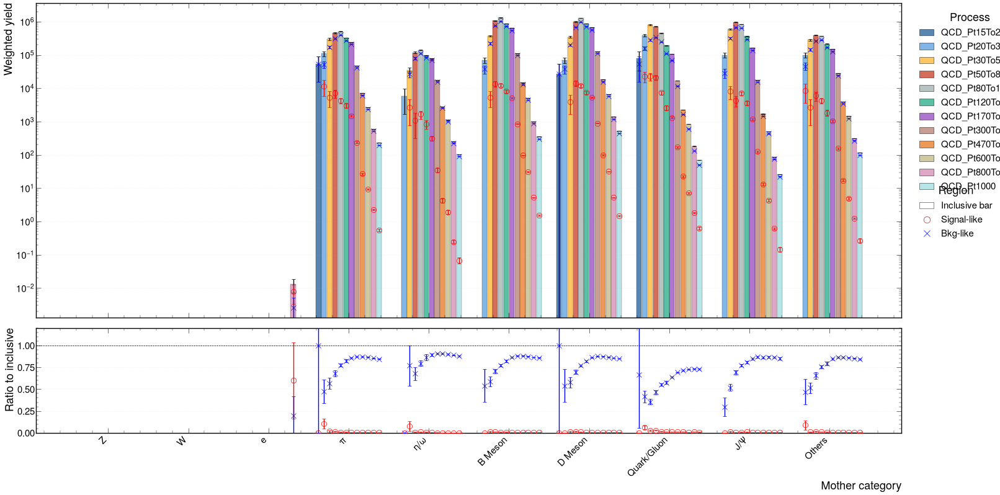

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


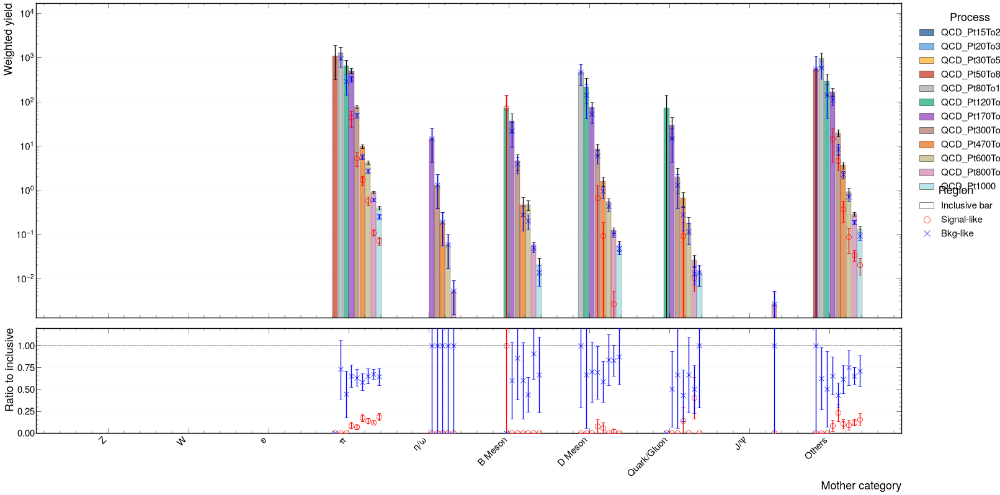

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


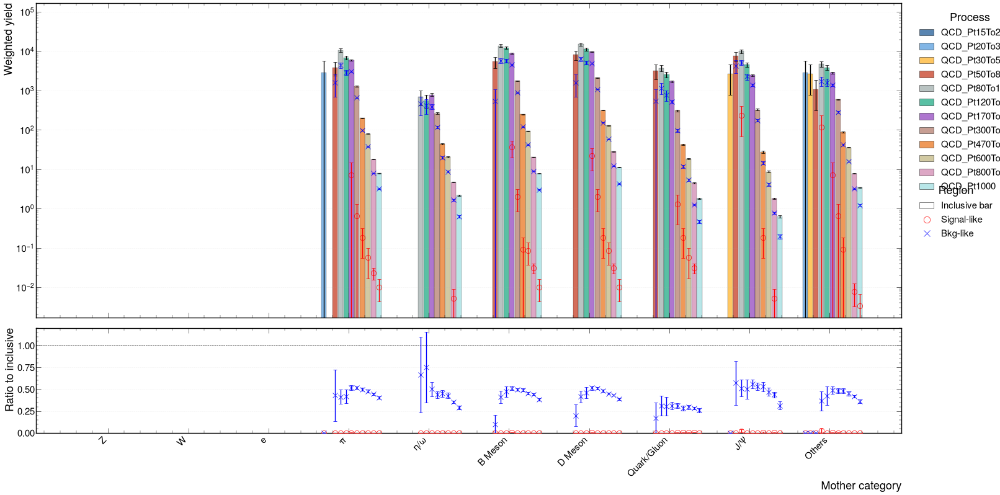

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


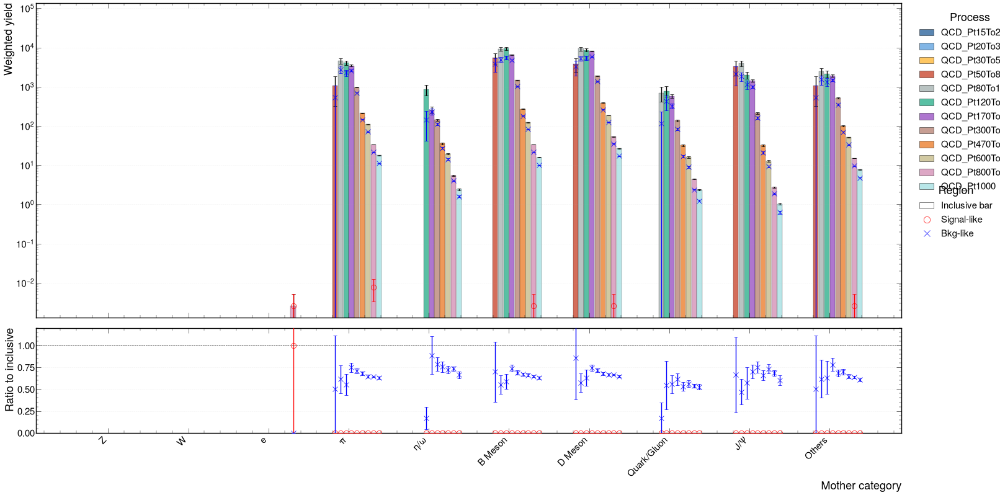


QCD sub-process: Photon


/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


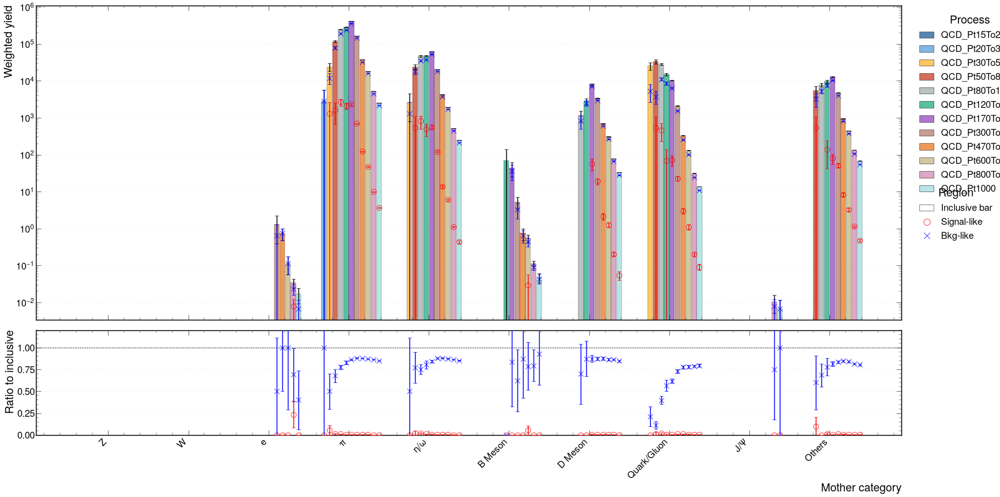

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


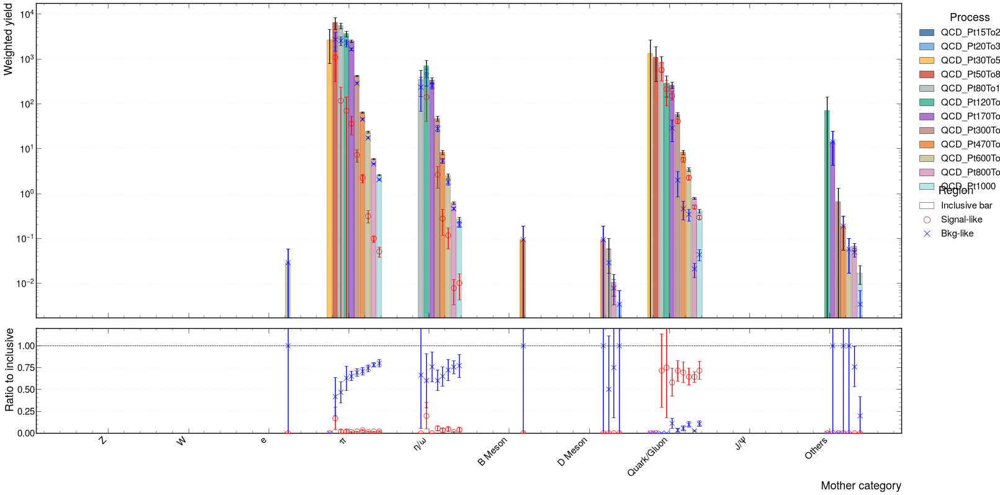

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


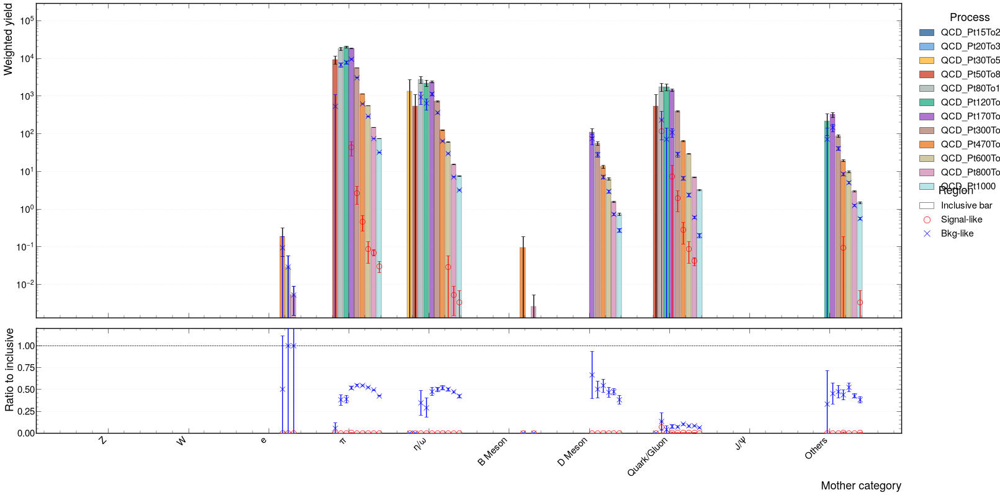

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


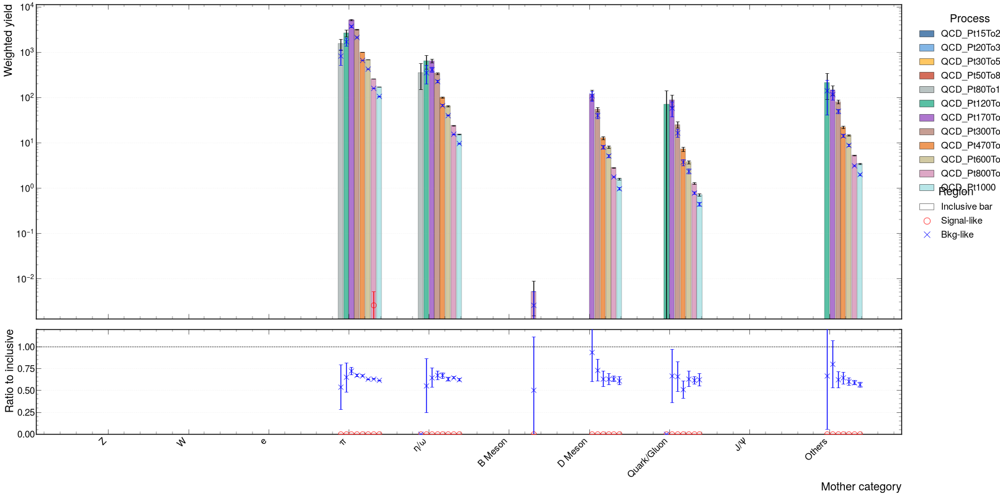


non-QCD sub-process: Inclusive


/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


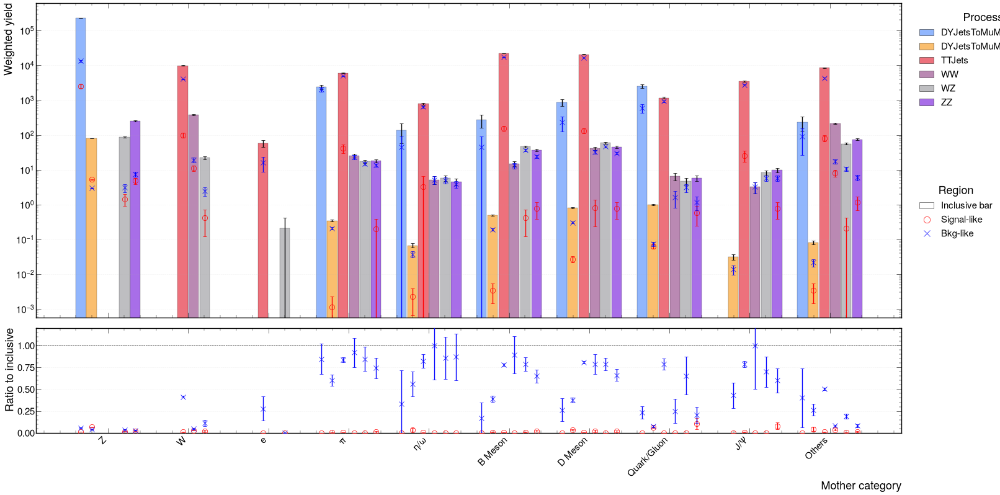

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


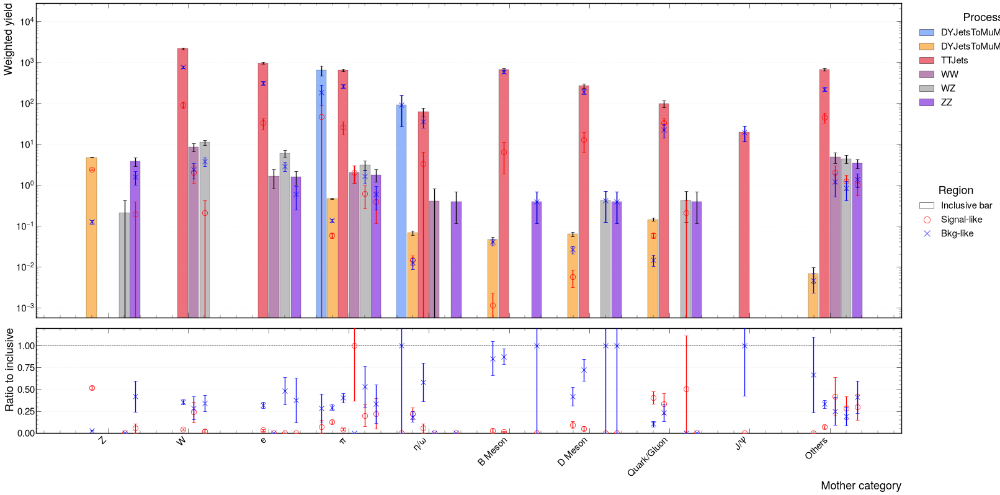

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


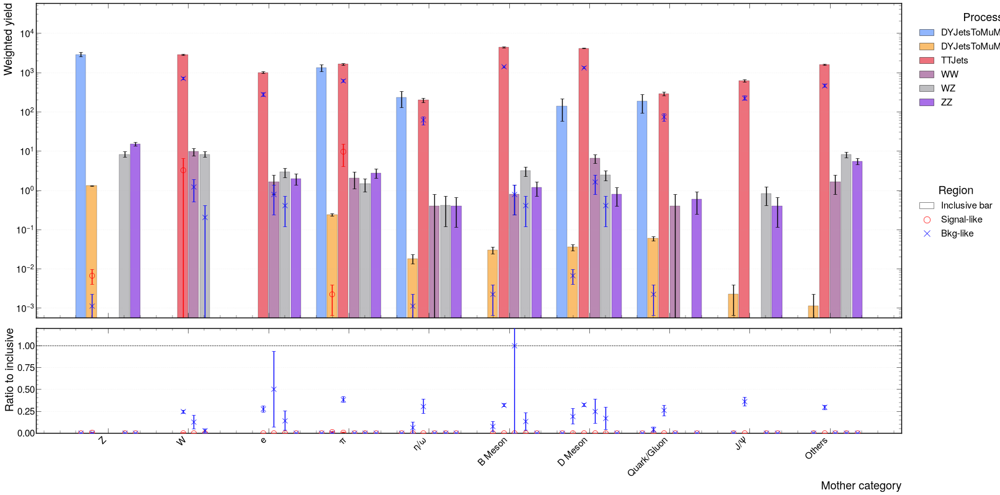

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


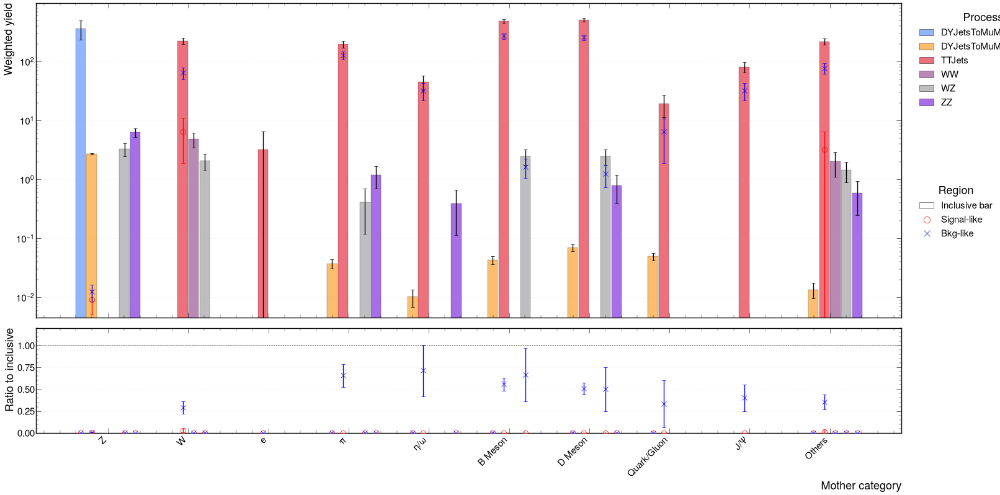


non-QCD sub-process: Electron


/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


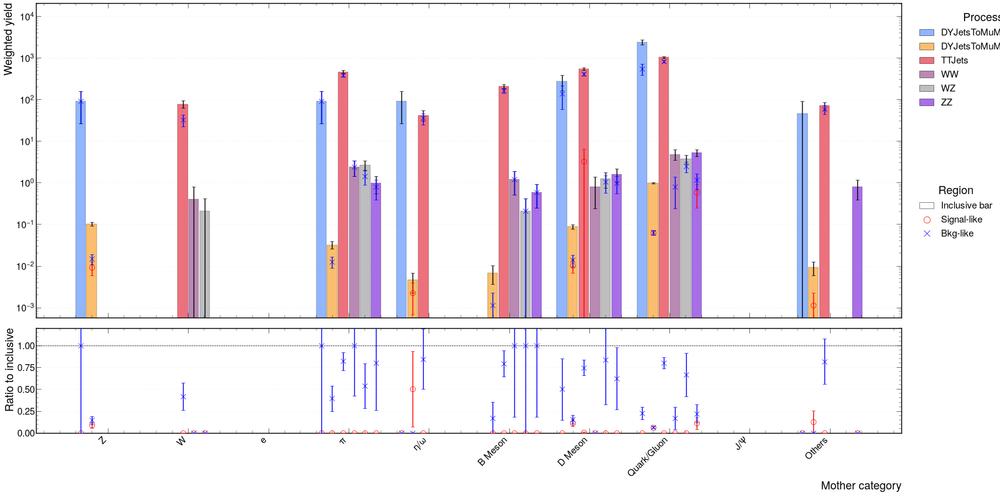

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


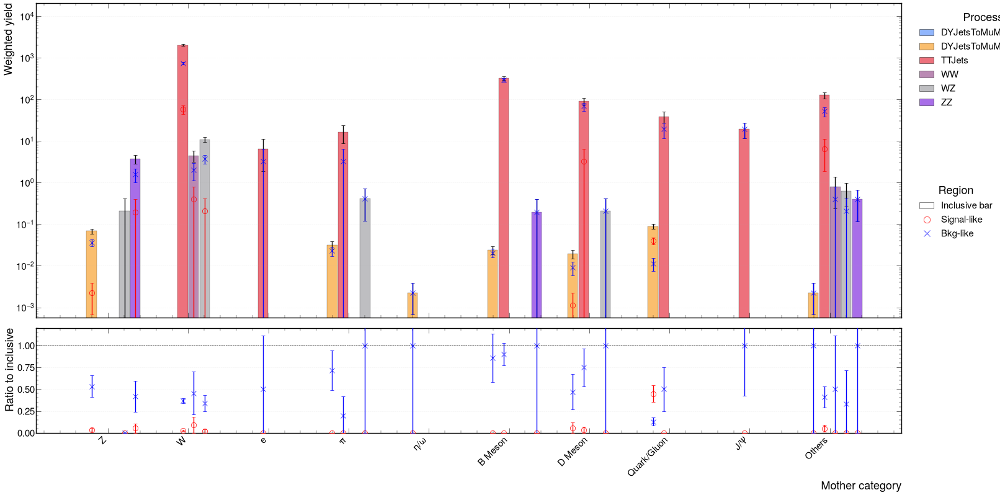

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


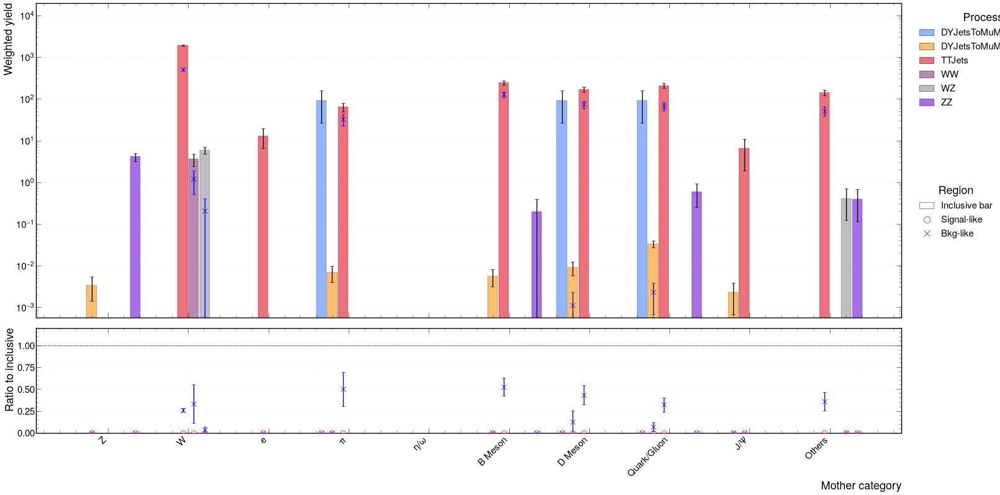

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


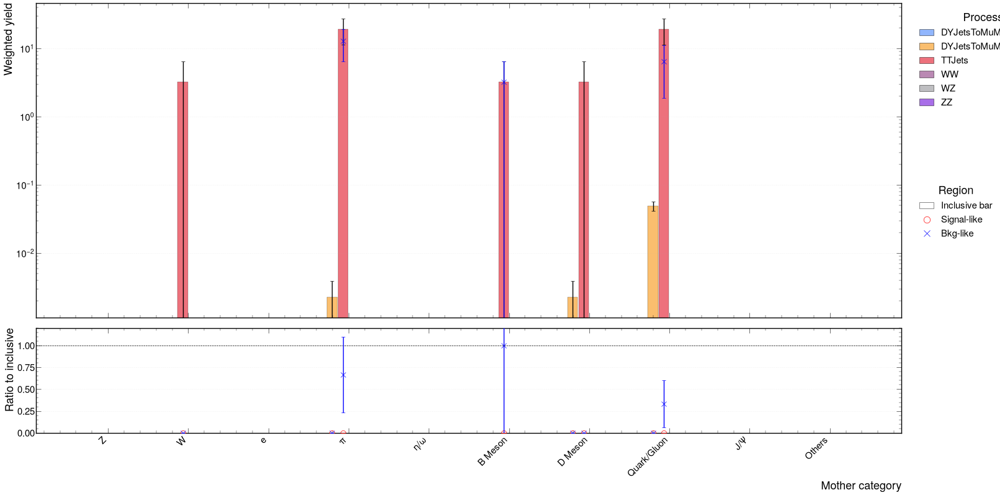


non-QCD sub-process: Muon


/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


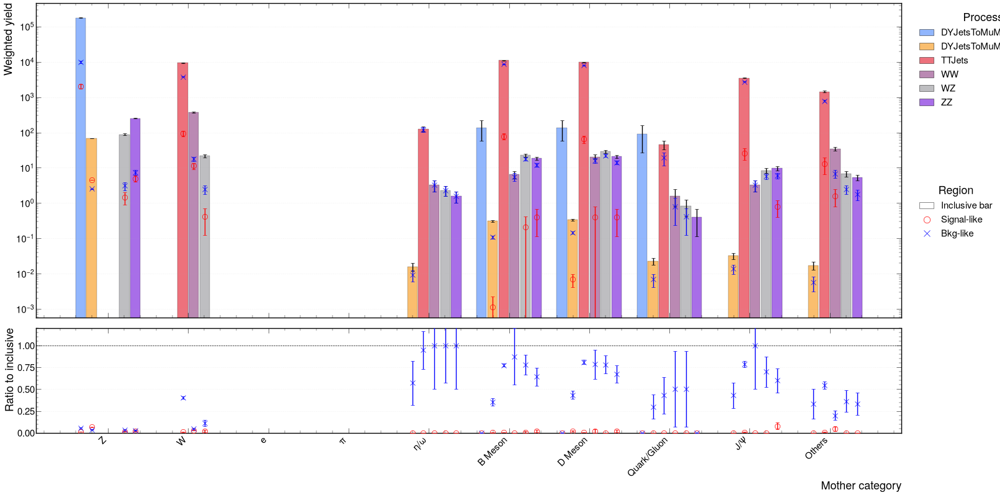

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


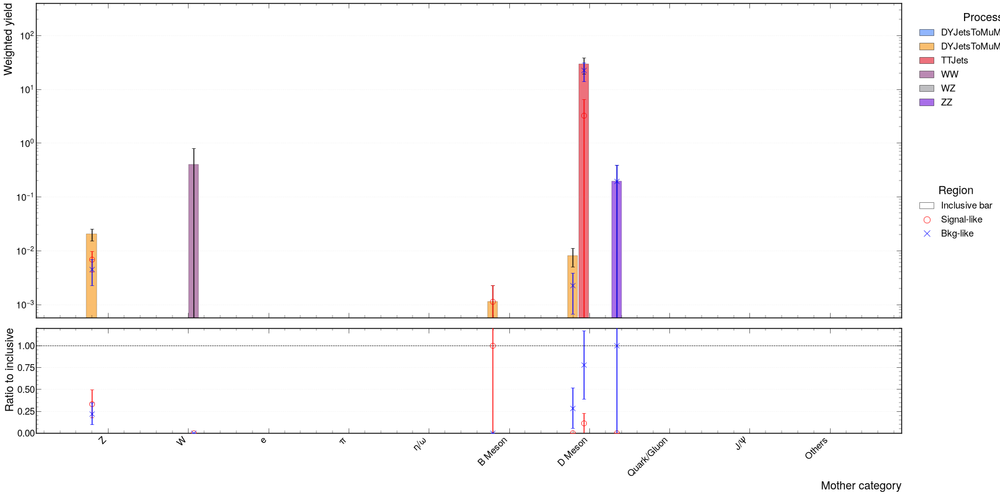

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


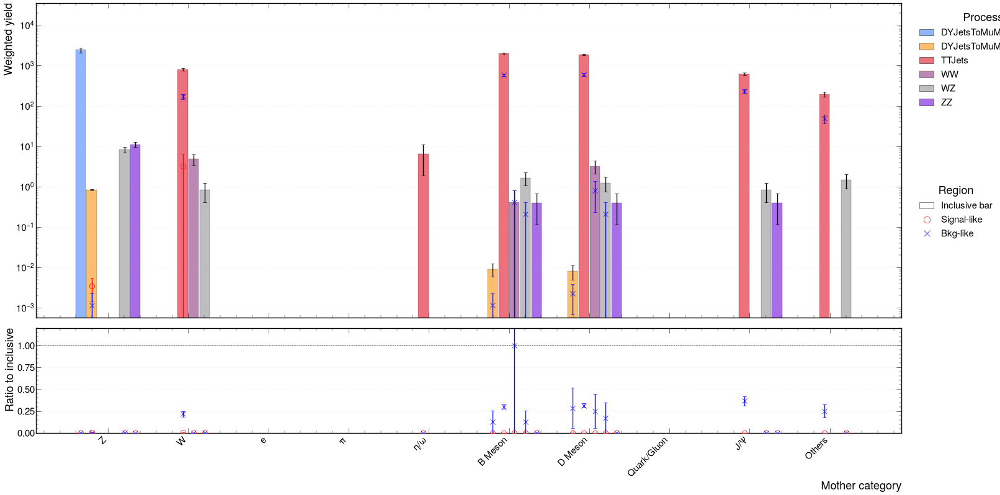

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


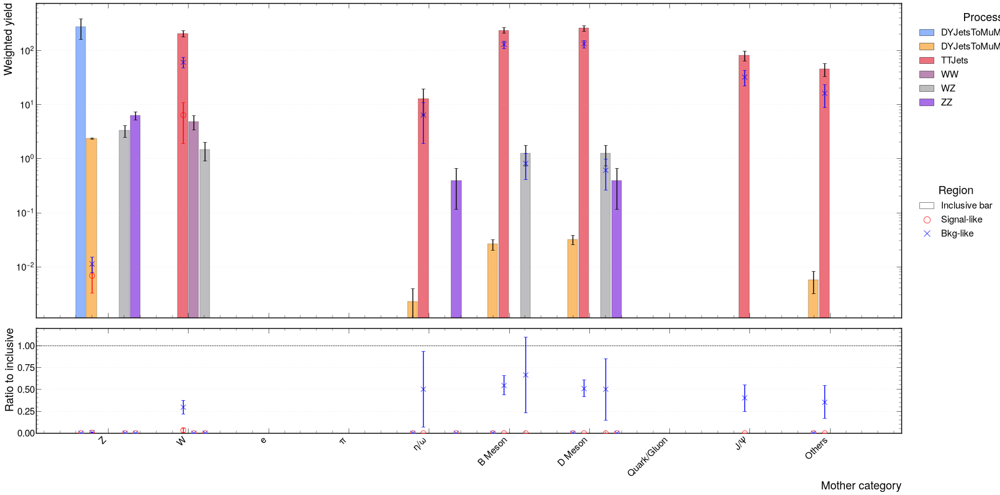


non-QCD sub-process: Photon


/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


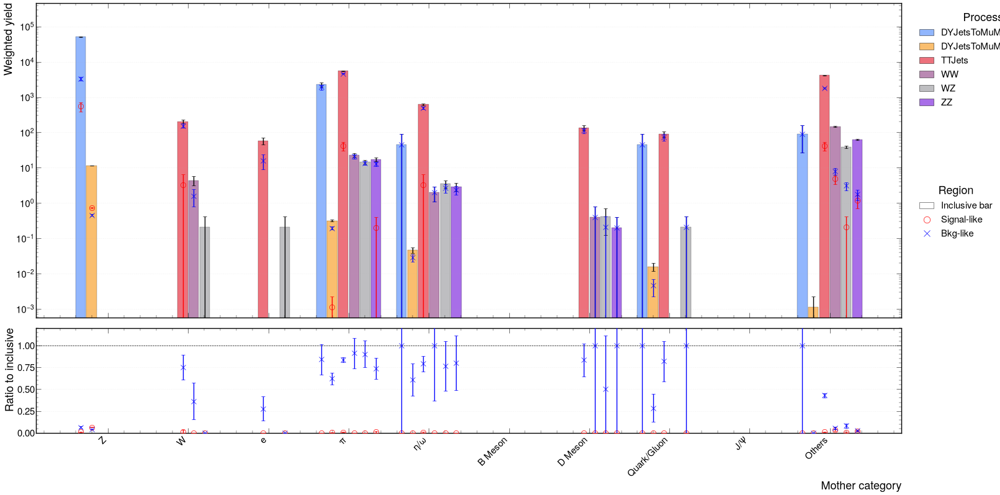

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


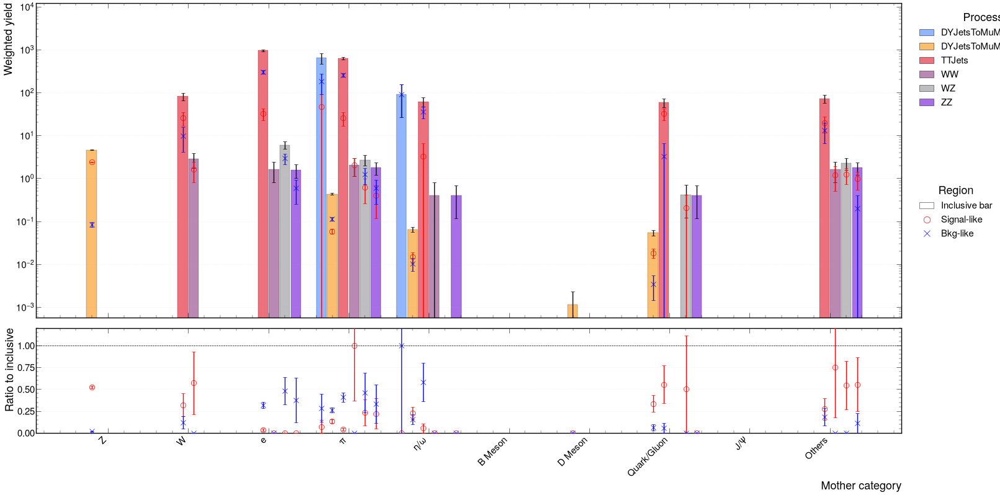

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


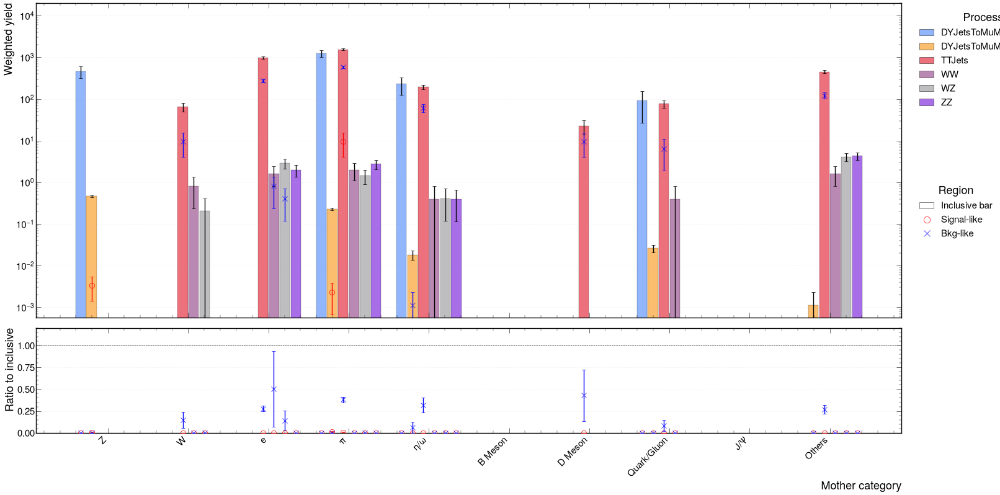

/tmp/ipykernel_6091/2216181110.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


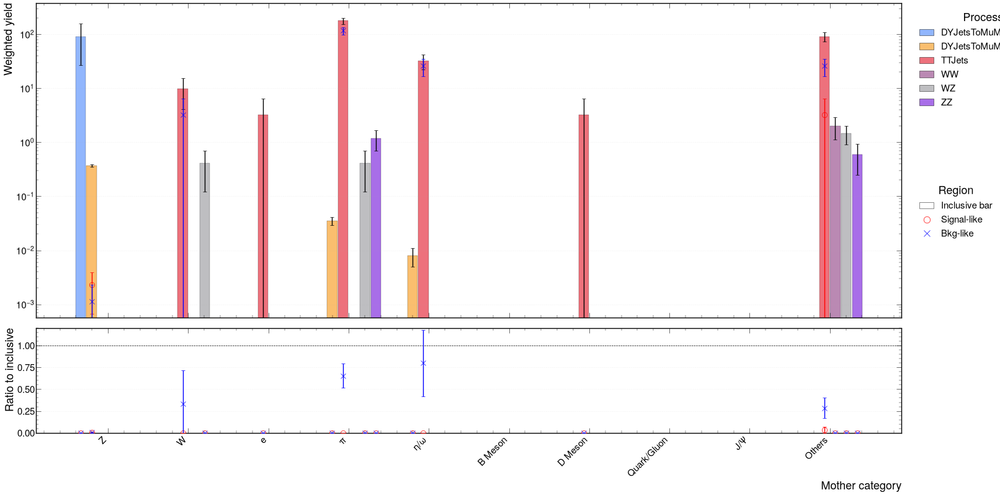

In [17]:
# ============================================================
# Process-aware inclusive yield with signal-like/bkg-like overlay
#   signal-like: isolation pass + displacement pass (_both_pass)
#   bkg-like: isolation fail + displacement fail (_both_fail)
# ============================================================

from matplotlib.lines import Line2D
from matplotlib.patches import Patch

INCLUSIVE_DIR = "Mother_Tracking_LJ_Kinematics_BKG"
APPLY_CUTS_DIR = "Mother_Tracking_LJ_Kinematics_BKG"

REGION_LABELS = {
    "inclusive": "Inclusive",
    "both_pass": "Signal-like",
    "both_fail": "Bkg-like",
}

REGION_MARKER_COLORS = {
    "Signal-like": "red",
    "Bkg-like": "blue",
}

OVERLAY_HISTOGRAMS = {
    "Inclusive": "fs_gen_mother_id",
    **OBJECT_HISTOGRAMS,
}

OVERLAY_SAMPLE_GROUP_SETS = {
    "grouped background": background_groups,
    "QCD sub-process": qcd_process_groups,
    "non-QCD sub-process": nonqcd_process_groups,
}

CR_CHANNEL_MAP = {
    channel: {
        "inclusive": channel,
        "both_pass": f"{channel}_both_pass",
        "both_fail": f"{channel}_both_fail",
    }
    for channel in channels
}

def resolve_mother_tracking_path(dirname):
    candidates = [
        dirname,
        os.path.join("sidm", "studies", "Mother_Tracking", dirname),
        os.path.join(os.getcwd(), dirname),
    ]

    for candidate in candidates:
        if os.path.isdir(candidate):
            return candidate

    raise FileNotFoundError(f"Could not find directory: {dirname}")

def get_single_metadata_value(metadata, key, default=None):
    value = metadata.get(key, default)
    if isinstance(value, (set, list, tuple)):
        return next(iter(value), default)
    return value

def scale_sample_hists_to_lumixs(
    sample,
    sample_output,
    default_year="2018",
    reference_output=None,
):
    metadata = sample_output.get("metadata", {})
    reference_metadata = metadata if reference_output is None else reference_output.get("metadata", metadata)

    is_data = get_single_metadata_value(reference_metadata, "is_data", False)
    if is_data:
        return 1.0

    year = get_single_metadata_value(reference_metadata, "year", default_year)
    if year is None:
        year = default_year
    year = str(year)

    sum_weights = reference_metadata.get("scaled_sum_weights")
    if sum_weights is None:
        print(f"[WARNING] no reference scaled_sum_weights for {sample}; not scaling hists")
        return 1.0

    lumixs_weight = utilities.get_lumixs_weight(sample, year, sum_weights)
    for hist_name in sample_output.get("hists", {}):
        sample_output["hists"][hist_name] *= lumixs_weight

    return lumixs_weight

def load_coffea_outputs(
    sample_names,
    dirname,
    scale_mc_hists=False,
    default_year="2018",
    reference_outputs=None,
):
    output = {}
    directory = resolve_mother_tracking_path(dirname)

    for sample in sample_names:
        path = os.path.join(directory, f"{sample}.coffea")
        if not os.path.exists(path):
            print(f"[WARNING] missing coffea file: {path}")
            continue

        loaded = coffea.util.load(path)
        output[sample] = get_sample_output(loaded, sample)
        if scale_mc_hists:
            reference_output = None if reference_outputs is None else reference_outputs.get(sample)
            scale = scale_sample_hists_to_lumixs(
                sample,
                output[sample],
                default_year=default_year,
                reference_output=reference_output,
            )
            source = "reference" if reference_output is not None else "self"
            print(f"Scaled apply-cuts hists for {sample} by {scale:.6g} using {source} metadata")

    return output

def unique_group_samples(sample_groups):
    samples = []
    for group_samples in sample_groups.values():
        for sample in group_samples:
            if sample not in samples:
                samples.append(sample)
    return samples

def unique_samples_from_group_sets(sample_group_sets):
    samples = []
    for sample_groups in sample_group_sets.values():
        for sample in unique_group_samples(sample_groups):
            if sample not in samples:
                samples.append(sample)
    return samples

def make_process_region_tables(
    inclusive_output,
    apply_cuts_output,
    sample_groups,
    channel,
    histogram_name="fs_gen_mother_id",
):
    channel_map = CR_CHANNEL_MAP[channel]

    inclusive_yield, _, _ = make_category_tables(
        inclusive_output,
        sample_groups,
        channel_map["inclusive"],
        histogram_name,
        categorize_background_mother,
        BACKGROUND_CATEGORY_ORDER,
    )
    inclusive_error = make_category_error_table(
        inclusive_output,
        sample_groups,
        channel_map["inclusive"],
        histogram_name,
        categorize_background_mother,
        BACKGROUND_CATEGORY_ORDER,
    )
    pass_yield, _, _ = make_category_tables(
        apply_cuts_output,
        sample_groups,
        channel_map["both_pass"],
        histogram_name,
        categorize_background_mother,
        BACKGROUND_CATEGORY_ORDER,
    )
    pass_error = make_category_error_table(
        apply_cuts_output,
        sample_groups,
        channel_map["both_pass"],
        histogram_name,
        categorize_background_mother,
        BACKGROUND_CATEGORY_ORDER,
    )
    fail_yield, _, _ = make_category_tables(
        apply_cuts_output,
        sample_groups,
        channel_map["both_fail"],
        histogram_name,
        categorize_background_mother,
        BACKGROUND_CATEGORY_ORDER,
    )
    fail_error = make_category_error_table(
        apply_cuts_output,
        sample_groups,
        channel_map["both_fail"],
        histogram_name,
        categorize_background_mother,
        BACKGROUND_CATEGORY_ORDER,
    )

    inclusive_yield = inclusive_yield.fillna(0.0)
    pass_yield = pass_yield.reindex_like(inclusive_yield).fillna(0.0)
    fail_yield = fail_yield.reindex_like(inclusive_yield).fillna(0.0)

    inclusive_error = inclusive_error.reindex_like(inclusive_yield).fillna(0.0)
    pass_error = pass_error.reindex_like(inclusive_yield).fillna(0.0)
    fail_error = fail_error.reindex_like(inclusive_yield).fillna(0.0)

    return {
        REGION_LABELS["inclusive"]: inclusive_yield,
        REGION_LABELS["both_pass"]: pass_yield,
        REGION_LABELS["both_fail"]: fail_yield,
        "_errors": {
            REGION_LABELS["inclusive"]: inclusive_error,
            REGION_LABELS["both_pass"]: pass_error,
            REGION_LABELS["both_fail"]: fail_error,
        },
    }

def ratio_uncertainty(numerator, numerator_error, denominator, denominator_error):
    numerator = np.asarray(numerator, dtype=float)
    numerator_error = np.asarray(numerator_error, dtype=float)
    denominator = np.asarray(denominator, dtype=float)
    denominator_error = np.asarray(denominator_error, dtype=float)

    ratio = np.full(numerator.shape, np.nan, dtype=float)
    error = np.full(numerator.shape, np.nan, dtype=float)

    valid = (
        np.isfinite(numerator)
        & np.isfinite(numerator_error)
        & np.isfinite(denominator)
        & np.isfinite(denominator_error)
        & (denominator > 0)
    )

    ratio[valid] = numerator[valid] / denominator[valid]

    positive_num = valid & (numerator > 0)
    error[positive_num] = ratio[positive_num] * np.sqrt(
        (numerator_error[positive_num] / numerator[positive_num]) ** 2
        + (denominator_error[positive_num] / denominator[positive_num]) ** 2
    )

    zero_num = valid & (numerator == 0)
    error[zero_num] = numerator_error[zero_num] / denominator[zero_num]

    return ratio, error

def plot_process_overlay_with_ratio(
    region_tables,
    title,
    figsize=(36, 18),
    logy=True,
    ratio_ylim=(0, 3),
    cms_label=False,
):
    inclusive_table = region_tables["Inclusive"]
    pass_table = region_tables["Signal-like"]
    fail_table = region_tables["Bkg-like"]
    error_tables = region_tables.get("_errors", {})
    inclusive_error_table = error_tables.get("Inclusive", inclusive_table * 0.0)
    pass_error_table = error_tables.get("Signal-like", pass_table * 0.0)
    fail_error_table = error_tables.get("Bkg-like", fail_table * 0.0)

    processes = list(inclusive_table.index)
    categories = list(inclusive_table.columns)
    x = np.arange(len(categories))
    n_processes = len(processes)
    total_width = 0.82
    bar_width = total_width / max(n_processes, 1)
    offsets = (np.arange(n_processes) - (n_processes - 1) / 2) * bar_width

    fig, (ax, rax) = plt.subplots(
        2,
        1,
        figsize=figsize,
        sharex=True,
        gridspec_kw={"height_ratios": [3, 1], "hspace": 0.05},
    )

    for i, process in enumerate(processes):
        positions = x + offsets[i]
        color = PROCESS_COLORS.get(process)
        inclusive_yield = inclusive_table.loc[process, categories].to_numpy(dtype=float)
        inclusive_error = inclusive_error_table.loc[process, categories].to_numpy(dtype=float)
        pass_yield = pass_table.loc[process, categories].to_numpy(dtype=float)
        pass_error = pass_error_table.loc[process, categories].to_numpy(dtype=float)
        fail_yield = fail_table.loc[process, categories].to_numpy(dtype=float)
        fail_error = fail_error_table.loc[process, categories].to_numpy(dtype=float)

        ax.bar(
            positions,
            inclusive_yield,
            width=bar_width * 0.92,
            label=process,
            color=color,
            edgecolor="black",
            linewidth=0.5,
            alpha=0.65,
            zorder=1,
        )
        ax.errorbar(
            positions[inclusive_yield > 0],
            inclusive_yield[inclusive_yield > 0],
            yerr=inclusive_error[inclusive_yield > 0],
            fmt="none",
            ecolor="black",
            elinewidth=2,
            capsize=4,
            zorder=3,
        )

        pass_mask = np.isfinite(pass_yield) & (pass_yield > 0)
        fail_mask = np.isfinite(fail_yield) & (fail_yield > 0)
        ax.errorbar(
            positions[pass_mask],
            pass_yield[pass_mask],
            yerr=pass_error[pass_mask],
            marker="o",
            markersize=12,
            markerfacecolor="none",
            markeredgecolor=REGION_MARKER_COLORS["Signal-like"],
            linestyle="none",
            ecolor=REGION_MARKER_COLORS["Signal-like"],
            elinewidth=2,
            capsize=4,
            zorder=4,
        )
        ax.errorbar(
            positions[fail_mask],
            fail_yield[fail_mask],
            yerr=fail_error[fail_mask],
            marker="x",
            markersize=12,
            color=REGION_MARKER_COLORS["Bkg-like"],
            linestyle="none",
            ecolor=REGION_MARKER_COLORS["Bkg-like"],
            elinewidth=2,
            capsize=4,
            zorder=5,
        )

        pass_ratio, pass_ratio_error = ratio_uncertainty(
            pass_yield,
            pass_error,
            inclusive_yield,
            inclusive_error,
        )
        fail_ratio, fail_ratio_error = ratio_uncertainty(
            fail_yield,
            fail_error,
            inclusive_yield,
            inclusive_error,
        )

        pass_ratio_mask = np.isfinite(pass_ratio)
        fail_ratio_mask = np.isfinite(fail_ratio)
        rax.errorbar(
            positions[pass_ratio_mask],
            pass_ratio[pass_ratio_mask],
            yerr=pass_ratio_error[pass_ratio_mask],
            marker="o",
            markersize=12,
            markerfacecolor="none",
            markeredgecolor=REGION_MARKER_COLORS["Signal-like"],
            linestyle="none",
            ecolor=REGION_MARKER_COLORS["Signal-like"],
            elinewidth=2,
            capsize=4,
            zorder=4,
        )
        rax.errorbar(
            positions[fail_ratio_mask],
            fail_ratio[fail_ratio_mask],
            yerr=fail_ratio_error[fail_ratio_mask],
            marker="x",
            markersize=12,
            color=REGION_MARKER_COLORS["Bkg-like"],
            linestyle="none",
            ecolor=REGION_MARKER_COLORS["Bkg-like"],
            elinewidth=2,
            capsize=4,
            zorder=5,
        )

    ax.set_title(title)
    ax.set_ylabel("Weighted yield")
    ax.grid(axis="y", alpha=0.3, zorder=0)

    if logy:
        ax.set_yscale("log")
        positive_min = pd.concat([inclusive_table, pass_table, fail_table]).replace(0, np.nan).min().min()
        if pd.notna(positive_min):
            ax.set_ylim(bottom=max(positive_min * 0.5, 1e-6))

    process_handles = [
        Patch(
            facecolor=PROCESS_COLORS.get(process, "gray"),
            edgecolor="black",
            alpha=0.65,
            label=process,
        )
        for process in processes
    ]
    region_handles = [
        Patch(facecolor="White", edgecolor="black", alpha=0.65, label="Inclusive bar"),
        Line2D([0], [0], marker="o", color=REGION_MARKER_COLORS["Signal-like"], markerfacecolor="none", linestyle="None", label="Signal-like", markersize=15),
        Line2D([0], [0], marker="x", color=REGION_MARKER_COLORS["Bkg-like"], linestyle="None", label="Bkg-like", markersize=15),
    ]

    process_legend = ax.legend(
        handles=process_handles,
        title="Process",
        bbox_to_anchor=(1.01, 1),
        loc="upper left",
    )
    ax.add_artist(process_legend)
    ax.legend(
        handles=region_handles,
        title="Region",
        bbox_to_anchor=(1.01, 0.45),
        loc="upper left",
    )

    rax.axhline(1.0, color="black", linestyle="--", linewidth=1)
    rax.set_ylabel("Ratio to inclusive")
    rax.set_ylim(*ratio_ylim)
    rax.grid(axis="y", alpha=0.3)
    rax.set_xticks(x)
    rax.set_xticklabels(categories, rotation=45, ha="right")
    rax.set_xlabel("Mother category")

    if cms_label:
        hep.cms.label(data=False, ax=ax)

    plt.tight_layout()
    plt.show()
    plt.close(fig)

def plot_cr_process_overlay(
    inclusive_output,
    apply_cuts_output,
    sample_groups,
    set_label,
    histogram_name="fs_gen_mother_id",
    object_label="Inclusive",
    channels_to_plot=None,
    logy=True,
    ratio_ylim=(0, 3),
    cms_label=False,
):
    if channels_to_plot is None:
        channels_to_plot = channels

    overlay_tables = {}
    for channel in channels_to_plot:
        region_tables = make_process_region_tables(
            inclusive_output,
            apply_cuts_output,
            sample_groups,
            channel,
            histogram_name,
        )
        overlay_tables[channel] = region_tables

        title_detail = set_label if object_label == "Inclusive" else f"{set_label} ({object_label})"
        plot_process_overlay_with_ratio(
            region_tables,
            # f"{channel}: {title_detail} inclusive yield with signal-like/bkg-like overlay",
            None,
            logy=logy,
            ratio_ylim=ratio_ylim,
            cms_label=cms_label,
        )

    return overlay_tables

def plot_all_overlay_sets(
    inclusive_output,
    apply_cuts_output,
    sample_group_sets,
    histogram_map=OVERLAY_HISTOGRAMS,
    channels_to_plot=None,
    logy=True,
    ratio_ylim=(0, 3),
):
    all_tables = {}

    for set_label, sample_groups in sample_group_sets.items():
        all_tables[set_label] = {}
        for object_label, histogram_name in histogram_map.items():
            print()
            print("=" * 120)
            print(f"{set_label}: {object_label}")
            print("=" * 120)

            all_tables[set_label][object_label] = plot_cr_process_overlay(
                inclusive_output,
                apply_cuts_output,
                sample_groups,
                set_label=set_label,
                histogram_name=histogram_name,
                object_label=object_label,
                channels_to_plot=channels_to_plot,
                logy=logy,
                ratio_ylim=ratio_ylim,
            )

    return all_tables

all_overlay_samples = unique_samples_from_group_sets(OVERLAY_SAMPLE_GROUP_SETS)

# Weighted Condor outputs are already scaled by the processor postprocess.
# Always reload both outputs from disk and do not apply temporary lumi*xsec scaling here.
inclusive_out = load_coffea_outputs(all_overlay_samples, INCLUSIVE_DIR)
apply_cuts_out = load_coffea_outputs(all_overlay_samples, APPLY_CUTS_DIR)

# Old temporary scaling/reuse path. Keep disabled for weighted outputs.
# try:
#     inclusive_out
#     print("inclusive_out already exists; reusing it")
# except NameError:
#     inclusive_out = load_coffea_outputs(all_overlay_samples, INCLUSIVE_DIR)
#
# APPLY_CUTS_SCALE_MC_HISTS = False
#
# if APPLY_CUTS_SCALE_MC_HISTS:
#     print("Reloading apply_cuts_out with temporary lumi*xsec histogram scaling")
#     apply_cuts_out = load_coffea_outputs(
#         all_overlay_samples,
#         APPLY_CUTS_DIR,
#         scale_mc_hists=True,
#         default_year="2018",
#         reference_outputs=inclusive_out,
#     )
# else:
#     try:
#         apply_cuts_out
#         print("apply_cuts_out already exists; reusing it")
#     except NameError:
#         apply_cuts_out = load_coffea_outputs(all_overlay_samples, APPLY_CUTS_DIR)

process_overlay_tables = plot_all_overlay_sets(
    inclusive_out,
    apply_cuts_out,
    OVERLAY_SAMPLE_GROUP_SETS,
    histogram_map=OVERLAY_HISTOGRAMS,
    logy=True,
    ratio_ylim=(0, 1.2),
)


/tmp/ipykernel_1343/2502921663.py:429: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


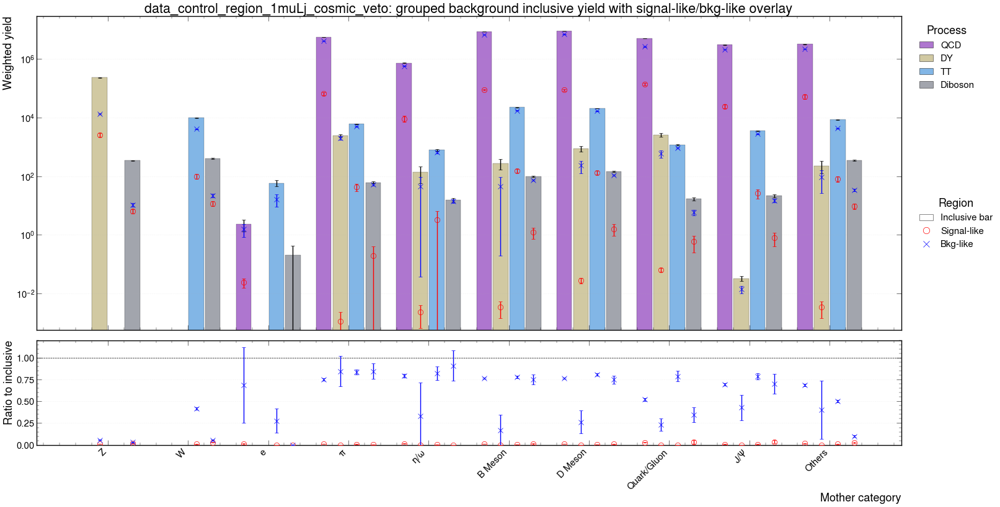

In [14]:
simulation_overlay_table = plot_cr_process_overlay(
    inclusive_out,
    apply_cuts_out,
    background_groups,
    set_label="grouped background",
    histogram_name="fs_gen_mother_id",
    object_label="Inclusive",
    channels_to_plot=["data_control_region_1muLj_cosmic_veto"],
    logy=True,
    ratio_ylim=(0, 1.2),
)

/tmp/ipykernel_1343/3088088760.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


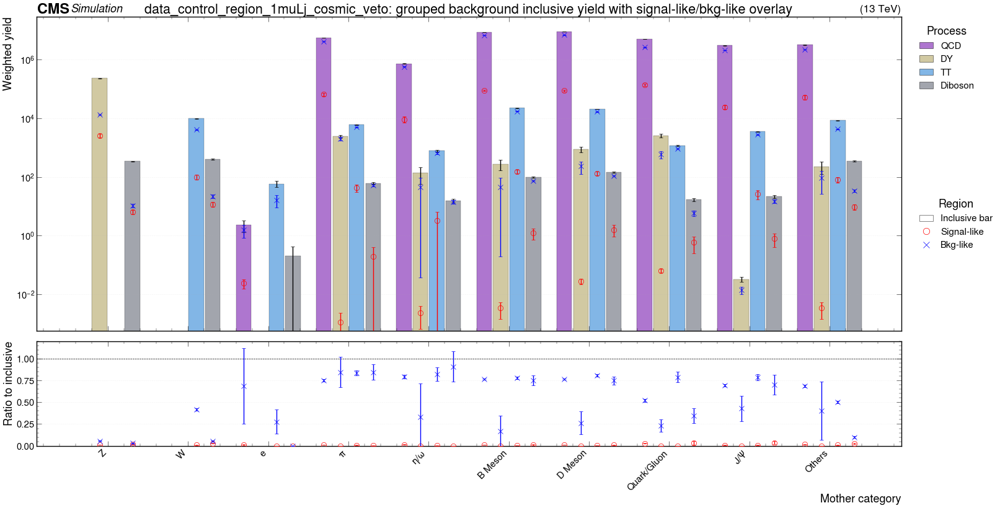

In [26]:
simulation_overlay_table = plot_cr_process_overlay(
    inclusive_out,
    apply_cuts_out,
    background_groups,
    set_label="grouped background",
    histogram_name="fs_gen_mother_id",
    object_label="Inclusive",
    channels_to_plot=["data_control_region_1muLj_cosmic_veto"],
    logy=True,
    ratio_ylim=(0, 1.2),
    cms_label=True,
)